In [1]:
import os
from glob import glob

import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.utils.data as data
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import unet_model as UNET
import cv2
import csv
from helper import load_obj
from scipy.spatial.transform import Rotation as R
from numpy.linalg import inv

import numpy as np
from PIL import Image
import warnings
warnings.filterwarnings(action='ignore')
#torch.backends.cudnn.benchmark = False

# Hyperparameter

In [2]:
print('Num_GPU :', torch.cuda.device_count())

no_cuda = False
use_cuda = not no_cuda and torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
Tensor = torch.cuda.FloatTensor if use_cuda else torch.Tensor

params = {
    'batch_size':2 * torch.cuda.device_count(),
    'test_batch_size':2 * torch.cuda.device_count(),
    'input_size':256,
    'resize_scale':280,
    'crop_size':256,
    'fliplr':False,
    'rot':True,
    #model params
    'epoch_count':1,
    'epochs':100,
    'log_interval':1000,
    'lr':0.0003,
    'dataroot':'C:/Users/IVCL/Desktop/crane',
}

Num_GPU : 2


# Utils

In [3]:
def to_np(x):
    return x.data.cpu().numpy()
        
def plot_train_result(test_image, epoch, save=False,  show=True, fig_size=(15, 15)):
    plt.figure(figsize=fig_size)
    imgs = [to_np(test_image[0]), to_np(test_image[1]), test_image[2], to_np(test_image[3]), test_image[4],
           to_np(test_image[5]), test_image[6]]
    title = ["Test Image", "Test Mask", "Predicted Mask", "Test U Mask", "Predicted U Mask", "Test V Mask", "Predicted V Mask"]
        
    plt.subplot(1, 7, 1)
    plt.title(title[0])
    img = imgs[0]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min())).transpose(1, 2, 0).astype(np.uint8)
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1, 7, 2)
    plt.title(title[1])
    img = imgs[1]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min()))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 3)
    plt.title(title[2])
    img = imgs[2]
    img = img.squeeze()
    img = to_np(torch.argmax(img, dim=0))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    
    plt.subplot(1, 7, 4)
    plt.title(title[3])
    img = imgs[3]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min()))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 5)
    plt.title(title[4])
    img = imgs[4]
    img = img.squeeze()
    img = to_np(torch.argmax(img, dim=0))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 6)
    plt.title(title[5])
    img = imgs[5]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min()))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 7)
    plt.title(title[6])
    img = imgs[6]
    img = img.squeeze()
    img = to_np(torch.argmax(img, dim=0))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    
    # save figure
    if save:
        save_fn = './img_per_epoch/epoch_{:d}'.format(epoch+1) + '.png'
        fig.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()

# Model

In [4]:
correspondence_block = UNET.UNet(
        n_channels=3, out_channels_id=2, out_channels_uv=256, bilinear=True)
correspondence_block = nn.DataParallel(correspondence_block)
correspondence_block.to(device)

DataParallel(
  (module): UNet(
    (inc): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (down1): Down(
      (maxpool_conv): Sequential(
        (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (1): DoubleConv(
          (double_conv): Sequential(
            (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
            (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), p

# Preprocess

In [5]:
train_image_paths = glob(params['dataroot'] + '/image_coco_512/*.png')[4001:]
train_mask_paths = glob(params['dataroot'] + '/mask_coco_512/*.png')[4001:]
train_u_mask_paths = glob(params['dataroot'] + '/U_mask_coco_512/*.png')[4001:]
train_v_mask_paths = glob(params['dataroot'] + '/V_mask_coco_512/*.png')[4001:]

val_image_paths = glob(params['dataroot'] + '/image_coco_512/*.png')[:4001]
val_mask_paths = glob(params['dataroot'] + '/mask_coco_512/*.png')[:4001]
val_u_mask_paths = glob(params['dataroot'] + '/U_mask_coco_512/*.png')[:4001]
val_v_mask_paths = glob(params['dataroot'] + '/V_mask_coco_512/*.png')[:4001]

test_image_paths = glob(params['dataroot'] + '/real_image/*.png')
test_mask_paths = glob(params['dataroot'] + '/real_mask/*.png')

In [6]:
class DatasetFromFolder(data.Dataset):
    def __init__(self, image_dir, mask_dir, u_mask_dir, v_mask_dir, transform=None, resize_scale=None, rot=None, crop_size=None,
                 fliplr=False):
        super(DatasetFromFolder, self).__init__()
        self.image_path = image_dir
        self.mask_path = mask_dir
        self.u_mask_path = u_mask_dir
        self.v_mask_path = v_mask_dir
        
        self.transform = transform
        
        self.resize_scale = resize_scale
        self.rot = rot
        self.crop_size = crop_size
        self.fliplr = fliplr

    def __getitem__(self, index):
        # Load Image
        img_fn = self.image_path[index]
        mask_fn = self.mask_path[index]
        u_mask_fn = self.u_mask_path[index]
        v_mask_fn = self.v_mask_path[index]
        
        img = cv2.imread(img_fn)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_fn, cv2.IMREAD_GRAYSCALE)
        u_mask = cv2.imread(u_mask_fn, cv2.IMREAD_GRAYSCALE)
        v_mask = cv2.imread(v_mask_fn, cv2.IMREAD_GRAYSCALE)
        
        seed = random.randint(1, 1000)
        random.seed(seed)
                          
        # preprocessing
        if self.resize_scale:
            img = cv2.resize(img, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
            mask = cv2.resize(mask, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
            u_mask = cv2.resize(u_mask, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
            v_mask = cv2.resize(v_mask, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
                   
        if self.crop_size:
            x = random.randint(0, self.resize_scale - self.crop_size)
            y = random.randint(0, self.resize_scale - self.crop_size)
            img = img[x:x + self.crop_size, y:y + self.crop_size]
            mask = mask[x:x + self.crop_size, y:y + self.crop_size]
            u_mask = u_mask[x:x + self.crop_size, y:y + self.crop_size]
            v_mask = v_mask[x:x + self.crop_size, y:y + self.crop_size]
        
        if self.rot:
            height, width, channel = img.shape
            temp_img = img
            angle = random.randint(-15, 15)
            matrix = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
            img = cv2.warpAffine(img, matrix, (width, height))
            for i in range(height):
                for j in range(width):
                    if img[i,j,0]==0 and img[i,j,1]==0 and img[i,j,2]==0:
                        img[i,j]=temp_img[i,j]
            mask = cv2.warpAffine(mask, matrix, (width, height))
            u_mask = cv2.warpAffine(u_mask, matrix, (width, height))
            v_mask = cv2.warpAffine(v_mask, matrix, (width, height))
        
        if self.fliplr:
            if random.random() < 0.5:
                img = cv2.flip(img, 1)
                mask = cv2.flip(mask, 1)
                u_mask = cv2.flip(u_mask, 1)
                v_mask = cv2.flip(v_mask, 1)
        
        mask = np.where(mask>0,1.0,0)
               
        if self.transform is not None:
            img = self.transform(img)
        else:
            transform = transforms.ToTensor()
            img = transform(img)
        mask = (torch.from_numpy(mask)).type(torch.double)
        u_mask = (torch.from_numpy(u_mask)).type(torch.int64)
        v_mask = (torch.from_numpy(v_mask)).type(torch.int64)        
        
        return img, mask, u_mask, v_mask
                                              
    def __len__(self):
        return len(self.image_path)

In [7]:
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.ToPILImage(),
                                transforms.ColorJitter(brightness=(0.2,1), contrast=(0.3,2), saturation=(0.2,2), hue=(-0.1,0.1)),
                                transforms.ToTensor()])

train_data = DatasetFromFolder(train_image_paths, train_mask_paths, train_u_mask_paths, train_v_mask_paths, transform=transform,
                               resize_scale=params['resize_scale'], rot=params['rot'], crop_size=params['crop_size'],
                               fliplr=params['fliplr'])
train_data_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=params['batch_size'], shuffle=True)

val_data = DatasetFromFolder(val_image_paths, val_mask_paths, val_u_mask_paths, val_v_mask_paths, transform=None,
                             resize_scale=params['input_size'])
val_data_loader = torch.utils.data.DataLoader(dataset=val_data, batch_size=params['test_batch_size'], shuffle=False)

In [8]:
for i, (data, mask, u_mask, v_mask) in enumerate(train_data_loader):
    if i == 0:
        print(data[0].shape, mask[0].shape, u_mask[0].shape, v_mask[0].shape)
        break

torch.Size([3, 256, 256]) torch.Size([256, 256]) torch.Size([256, 256]) torch.Size([256, 256])


(-0.5, 255.5, 255.5, -0.5)

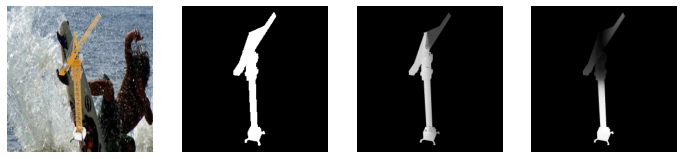

In [9]:
# Get specific val images
val_image, val_mask, val_u_mask, val_v_mask = val_data.__getitem__(5) # Convert to 4d tensor (BxNxHxW)
val_image = val_image.unsqueeze(0)

val_data_image = ((val_image - val_image.min()) / (val_image.max() - val_image.min()))

plt.figure(figsize=(12,12))
plt.subplot(1,4,1)
plt.imshow(val_data_image[0].permute(1,2,0))
plt.axis('off')
plt.subplot(1,4,2)
plt.imshow(val_mask,'gray')
plt.axis('off')
plt.subplot(1,4,3)
plt.imshow(val_u_mask,'gray')
plt.axis('off')
plt.subplot(1,4,4)
plt.imshow(val_v_mask,'gray')
plt.axis('off')

# Optimization

In [10]:
# setup optimizer
optimizer = optim.Adam(correspondence_block.parameters(), lr=params['lr'], weight_decay=3e-5)
criterion_m = nn.CrossEntropyLoss()
criterion_u = nn.CrossEntropyLoss()
criterion_v = nn.CrossEntropyLoss()

# Visualization

In [11]:
def visualization(model, test_path):
    model.eval()
    model.to(device)
    transform = transforms.Compose([transforms.ToTensor(),
                                transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0)])

    image = cv2.imread(test_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (params['input_size'], params['input_size']), cv2.INTER_CUBIC)
    image= transform(image).unsqueeze_(0)
    mask, u_mask, v_mask = model(image)

    mask = mask.squeeze()
    mask_out = to_np(torch.argmax(mask, dim=0))
    
    u_mask = u_mask.squeeze()
    u_mask_out = to_np(torch.argmax(u_mask, dim=0))   
    
    v_mask = v_mask.squeeze()
    v_mask_out = to_np(torch.argmax(v_mask, dim=0)) 
    
    test_image = plt.imread(test_path)
    
    plt.figure(figsize=(12,12))
    display_list = [test_image, mask_out, u_mask_out, v_mask_out]
    title = ['Input Image', 'Predicted Mask', 'Predicted U Mask', 'Predicted V Mask']
       
    plt.subplot(1, 4, 1)
    plt.title(title[0])
    plt.imshow(display_list[0])
    plt.axis('off')
        
    plt.subplot(1, 4, 2)
    plt.title(title[1])
    plt.imshow(display_list[1], 'gray')
    plt.axis('off')
    
    plt.subplot(1, 4, 3)
    plt.title(title[2])
    plt.imshow(display_list[2], 'gray')
    plt.axis('off')
    
    plt.subplot(1, 4, 4)
    plt.title(title[3])
    plt.imshow(display_list[3], 'gray')
    plt.axis('off') 
    
    plt.show()

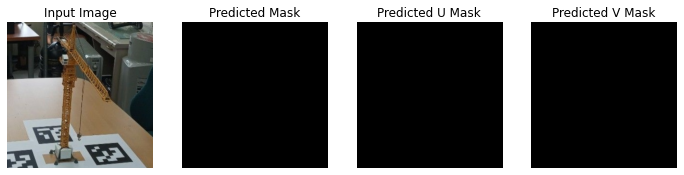

In [12]:
test_path = 'C:/Users/IVCL/Desktop/crane/real_image_crop/creal_0065.png'
visualization(correspondence_block, test_path)

# Training

In [14]:
checkpoint_path = './checkpoints/cpb_unet'

===> Epoch[1/100](0/5000): Loss_Mask: 0.7654	Loss_U_Mask: 5.4434	Loss_V_Mask: 5.5798
===> Epoch[1/100](1000/5000): Loss_Mask: 0.0513	Loss_U_Mask: 0.4700	Loss_V_Mask: 0.4794
===> Epoch[1/100](2000/5000): Loss_Mask: 0.0238	Loss_U_Mask: 0.4962	Loss_V_Mask: 0.5015
===> Epoch[1/100](3000/5000): Loss_Mask: 0.0196	Loss_U_Mask: 0.5027	Loss_V_Mask: 0.4726
===> Epoch[1/100](4000/5000): Loss_Mask: 0.0216	Loss_U_Mask: 0.4914	Loss_V_Mask: 0.4720
===> Epoch[1/100](5000/5000): Loss_Mask: 0.0183	Loss_U_Mask: 0.5105	Loss_V_Mask: 0.4789
Val_Loss_Mask: 0.0318	Val_U_Loss_Mask: 0.4079	Val_V_Loss_Mask: 0.3941


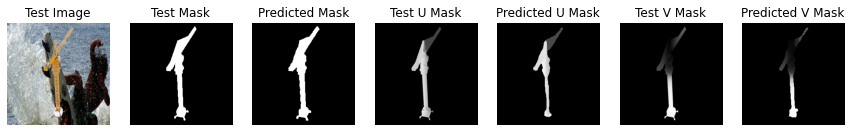

===> Epoch[2/100](0/5000): Loss_Mask: 0.0186	Loss_U_Mask: 0.4528	Loss_V_Mask: 0.4167
===> Epoch[2/100](1000/5000): Loss_Mask: 0.0177	Loss_U_Mask: 0.5146	Loss_V_Mask: 0.4827
===> Epoch[2/100](2000/5000): Loss_Mask: 0.0169	Loss_U_Mask: 0.5236	Loss_V_Mask: 0.4807
===> Epoch[2/100](3000/5000): Loss_Mask: 0.0168	Loss_U_Mask: 0.4044	Loss_V_Mask: 0.3676
===> Epoch[2/100](4000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.4375	Loss_V_Mask: 0.4124
===> Epoch[2/100](5000/5000): Loss_Mask: 0.0149	Loss_U_Mask: 0.3481	Loss_V_Mask: 0.3132
Val_Loss_Mask: 0.0276	Val_U_Loss_Mask: 0.4009	Val_V_Loss_Mask: 0.3851


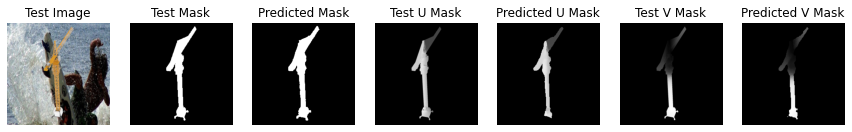

===> Epoch[3/100](0/5000): Loss_Mask: 0.0191	Loss_U_Mask: 0.4540	Loss_V_Mask: 0.4148
===> Epoch[3/100](1000/5000): Loss_Mask: 0.0225	Loss_U_Mask: 0.4126	Loss_V_Mask: 0.3654
===> Epoch[3/100](2000/5000): Loss_Mask: 0.0152	Loss_U_Mask: 0.4459	Loss_V_Mask: 0.3810
===> Epoch[3/100](3000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3180	Loss_V_Mask: 0.2882
===> Epoch[3/100](4000/5000): Loss_Mask: 0.0176	Loss_U_Mask: 0.3861	Loss_V_Mask: 0.3453
===> Epoch[3/100](5000/5000): Loss_Mask: 0.0139	Loss_U_Mask: 0.4155	Loss_V_Mask: 0.3423
Val_Loss_Mask: 0.0305	Val_U_Loss_Mask: 0.3841	Val_V_Loss_Mask: 0.3603


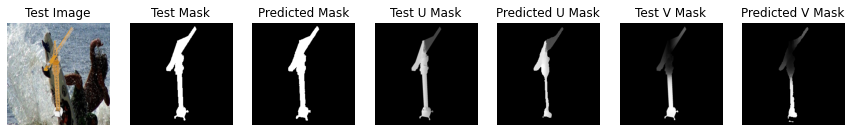

===> Epoch[4/100](0/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.4122	Loss_V_Mask: 0.3680
===> Epoch[4/100](1000/5000): Loss_Mask: 0.0137	Loss_U_Mask: 0.3881	Loss_V_Mask: 0.3245
===> Epoch[4/100](2000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.4300	Loss_V_Mask: 0.3928
===> Epoch[4/100](3000/5000): Loss_Mask: 0.0173	Loss_U_Mask: 0.3209	Loss_V_Mask: 0.2899
===> Epoch[4/100](4000/5000): Loss_Mask: 0.0223	Loss_U_Mask: 0.4447	Loss_V_Mask: 0.4393
===> Epoch[4/100](5000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.4849	Loss_V_Mask: 0.4573
Val_Loss_Mask: 0.0185	Val_U_Loss_Mask: 0.3884	Val_V_Loss_Mask: 0.3667


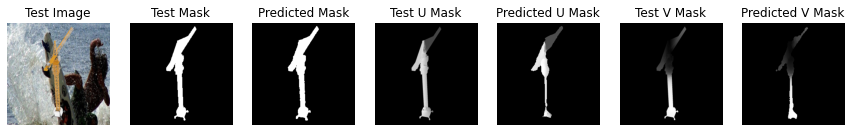

===> Epoch[5/100](0/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.4268	Loss_V_Mask: 0.4128
===> Epoch[5/100](1000/5000): Loss_Mask: 0.0211	Loss_U_Mask: 0.4262	Loss_V_Mask: 0.4093
===> Epoch[5/100](2000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.4482	Loss_V_Mask: 0.4149
===> Epoch[5/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3326	Loss_V_Mask: 0.2872
===> Epoch[5/100](4000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3360	Loss_V_Mask: 0.2838
===> Epoch[5/100](5000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3761	Loss_V_Mask: 0.3462
Val_Loss_Mask: 0.0190	Val_U_Loss_Mask: 0.3679	Val_V_Loss_Mask: 0.3389


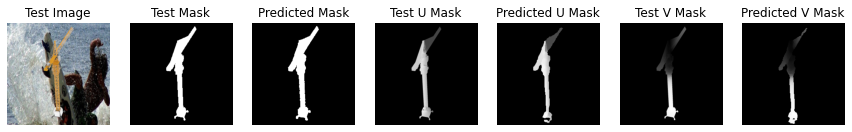

===> Epoch[6/100](0/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.4973	Loss_V_Mask: 0.4469
===> Epoch[6/100](1000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3737	Loss_V_Mask: 0.3415
===> Epoch[6/100](2000/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.4730	Loss_V_Mask: 0.4510
===> Epoch[6/100](3000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3834	Loss_V_Mask: 0.3370
===> Epoch[6/100](4000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3460	Loss_V_Mask: 0.3117
===> Epoch[6/100](5000/5000): Loss_Mask: 0.0218	Loss_U_Mask: 0.4479	Loss_V_Mask: 0.4111
Val_Loss_Mask: 0.0188	Val_U_Loss_Mask: 0.3821	Val_V_Loss_Mask: 0.3535


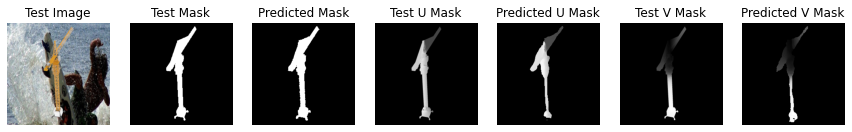

===> Epoch[7/100](0/5000): Loss_Mask: 0.0173	Loss_U_Mask: 0.4333	Loss_V_Mask: 0.3677
===> Epoch[7/100](1000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.2849	Loss_V_Mask: 0.2507
===> Epoch[7/100](2000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3824	Loss_V_Mask: 0.3385
===> Epoch[7/100](3000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3744	Loss_V_Mask: 0.3351
===> Epoch[7/100](4000/5000): Loss_Mask: 0.0192	Loss_U_Mask: 0.4079	Loss_V_Mask: 0.3370
===> Epoch[7/100](5000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3356	Loss_V_Mask: 0.2808
Val_Loss_Mask: 0.0214	Val_U_Loss_Mask: 0.3597	Val_V_Loss_Mask: 0.3321


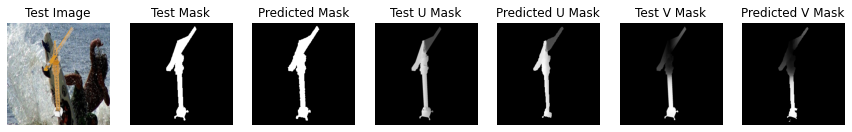

===> Epoch[8/100](0/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3043	Loss_V_Mask: 0.2668
===> Epoch[8/100](1000/5000): Loss_Mask: 0.0166	Loss_U_Mask: 0.4807	Loss_V_Mask: 0.4204
===> Epoch[8/100](2000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3357	Loss_V_Mask: 0.3033
===> Epoch[8/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3586	Loss_V_Mask: 0.3067
===> Epoch[8/100](4000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3513	Loss_V_Mask: 0.3060
===> Epoch[8/100](5000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3227	Loss_V_Mask: 0.2878
Val_Loss_Mask: 0.0216	Val_U_Loss_Mask: 0.3848	Val_V_Loss_Mask: 0.3656


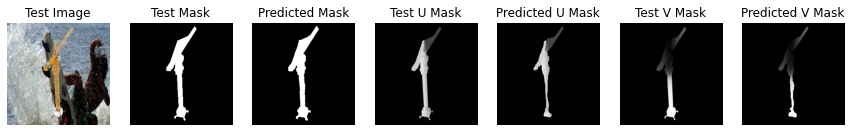

===> Epoch[9/100](0/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3090	Loss_V_Mask: 0.2690
===> Epoch[9/100](1000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3118	Loss_V_Mask: 0.2781
===> Epoch[9/100](2000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3507	Loss_V_Mask: 0.3149
===> Epoch[9/100](3000/5000): Loss_Mask: 0.0151	Loss_U_Mask: 0.3105	Loss_V_Mask: 0.2621
===> Epoch[9/100](4000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3444	Loss_V_Mask: 0.2954
===> Epoch[9/100](5000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.4755	Loss_V_Mask: 0.4814
Val_Loss_Mask: 0.0247	Val_U_Loss_Mask: 0.3775	Val_V_Loss_Mask: 0.3601


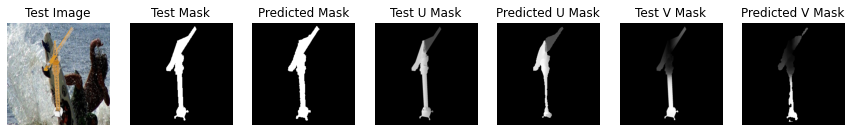

===> Epoch[10/100](0/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3533	Loss_V_Mask: 0.3106
===> Epoch[10/100](1000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3453	Loss_V_Mask: 0.3024
===> Epoch[10/100](2000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3927	Loss_V_Mask: 0.3581
===> Epoch[10/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3673	Loss_V_Mask: 0.3255
===> Epoch[10/100](4000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3538	Loss_V_Mask: 0.2789
===> Epoch[10/100](5000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.4120	Loss_V_Mask: 0.3607
Val_Loss_Mask: 0.0185	Val_U_Loss_Mask: 0.3634	Val_V_Loss_Mask: 0.3351


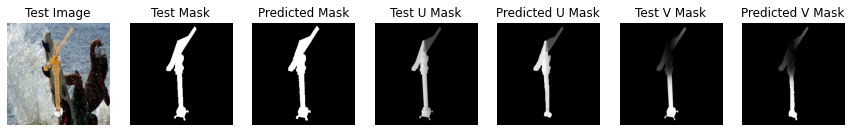

===> Epoch[11/100](0/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3148	Loss_V_Mask: 0.2690
===> Epoch[11/100](1000/5000): Loss_Mask: 0.0203	Loss_U_Mask: 0.3366	Loss_V_Mask: 0.2713
===> Epoch[11/100](2000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.4458	Loss_V_Mask: 0.4129
===> Epoch[11/100](3000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3748	Loss_V_Mask: 0.3208
===> Epoch[11/100](4000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3554	Loss_V_Mask: 0.2965
===> Epoch[11/100](5000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3965	Loss_V_Mask: 0.3551
Val_Loss_Mask: 0.0239	Val_U_Loss_Mask: 0.3866	Val_V_Loss_Mask: 0.3728


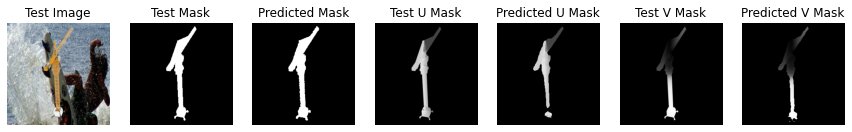

===> Epoch[12/100](0/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.3560	Loss_V_Mask: 0.3041
===> Epoch[12/100](1000/5000): Loss_Mask: 0.0155	Loss_U_Mask: 0.3329	Loss_V_Mask: 0.2764
===> Epoch[12/100](2000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3559	Loss_V_Mask: 0.2946
===> Epoch[12/100](3000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3428	Loss_V_Mask: 0.2907
===> Epoch[12/100](4000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.2882	Loss_V_Mask: 0.2563
===> Epoch[12/100](5000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3058	Loss_V_Mask: 0.2544
Val_Loss_Mask: 0.0199	Val_U_Loss_Mask: 0.3663	Val_V_Loss_Mask: 0.3384


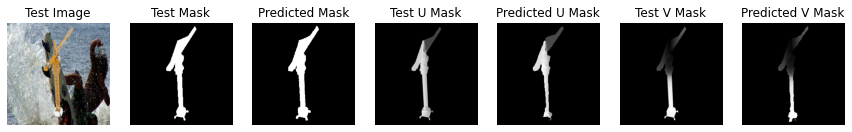

===> Epoch[13/100](0/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.3862	Loss_V_Mask: 0.3261
===> Epoch[13/100](1000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.4196	Loss_V_Mask: 0.3664
===> Epoch[13/100](2000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3452	Loss_V_Mask: 0.2899
===> Epoch[13/100](3000/5000): Loss_Mask: 0.0149	Loss_U_Mask: 0.4225	Loss_V_Mask: 0.3626
===> Epoch[13/100](4000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3618	Loss_V_Mask: 0.3235
===> Epoch[13/100](5000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3142	Loss_V_Mask: 0.2678
Val_Loss_Mask: 0.0207	Val_U_Loss_Mask: 0.3684	Val_V_Loss_Mask: 0.3414


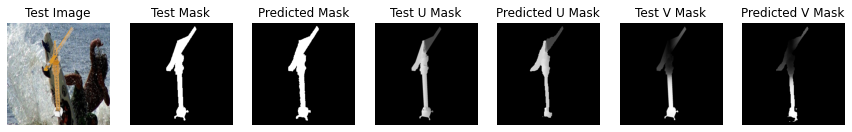

===> Epoch[14/100](0/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3717	Loss_V_Mask: 0.3263
===> Epoch[14/100](1000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3271	Loss_V_Mask: 0.2864
===> Epoch[14/100](2000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3665	Loss_V_Mask: 0.3013
===> Epoch[14/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3163	Loss_V_Mask: 0.2550
===> Epoch[14/100](4000/5000): Loss_Mask: 0.0135	Loss_U_Mask: 0.3446	Loss_V_Mask: 0.2829
===> Epoch[14/100](5000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3649	Loss_V_Mask: 0.3394
Val_Loss_Mask: 0.0199	Val_U_Loss_Mask: 0.3875	Val_V_Loss_Mask: 0.3635


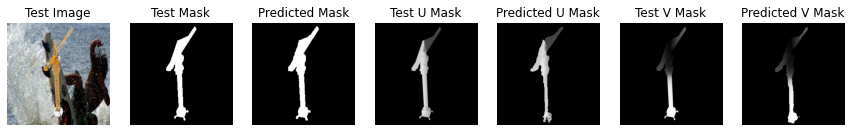

===> Epoch[15/100](0/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3013	Loss_V_Mask: 0.2533
===> Epoch[15/100](1000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.4042	Loss_V_Mask: 0.3584
===> Epoch[15/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3523	Loss_V_Mask: 0.3169
===> Epoch[15/100](3000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3449	Loss_V_Mask: 0.3109
===> Epoch[15/100](4000/5000): Loss_Mask: 0.0414	Loss_U_Mask: 0.4746	Loss_V_Mask: 0.4378
===> Epoch[15/100](5000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3794	Loss_V_Mask: 0.3186
Val_Loss_Mask: 0.0170	Val_U_Loss_Mask: 0.3637	Val_V_Loss_Mask: 0.3454


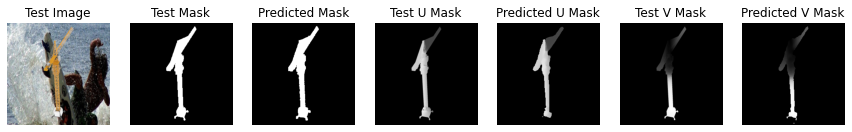

===> Epoch[16/100](0/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3126	Loss_V_Mask: 0.2718
===> Epoch[16/100](1000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3973	Loss_V_Mask: 0.3428
===> Epoch[16/100](2000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3978	Loss_V_Mask: 0.3577
===> Epoch[16/100](3000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3547	Loss_V_Mask: 0.2973
===> Epoch[16/100](4000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3744	Loss_V_Mask: 0.3250
===> Epoch[16/100](5000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3198	Loss_V_Mask: 0.2829
Val_Loss_Mask: 0.0221	Val_U_Loss_Mask: 0.3898	Val_V_Loss_Mask: 0.3725


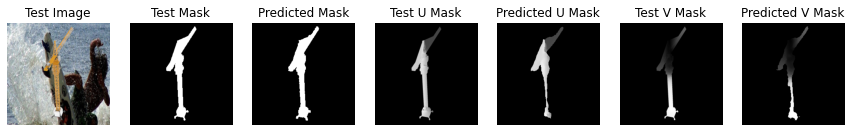

===> Epoch[17/100](0/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3802	Loss_V_Mask: 0.3225
===> Epoch[17/100](1000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3642	Loss_V_Mask: 0.3128
===> Epoch[17/100](2000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3559	Loss_V_Mask: 0.3077
===> Epoch[17/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3719	Loss_V_Mask: 0.3030
===> Epoch[17/100](4000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.2977	Loss_V_Mask: 0.2559
===> Epoch[17/100](5000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3146	Loss_V_Mask: 0.2652
Val_Loss_Mask: 0.0171	Val_U_Loss_Mask: 0.3723	Val_V_Loss_Mask: 0.3495


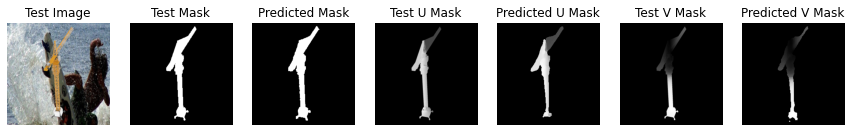

===> Epoch[18/100](0/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3754	Loss_V_Mask: 0.3290
===> Epoch[18/100](1000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3760	Loss_V_Mask: 0.3127
===> Epoch[18/100](2000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3358	Loss_V_Mask: 0.2816
===> Epoch[18/100](3000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.4388	Loss_V_Mask: 0.4111
===> Epoch[18/100](4000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3530	Loss_V_Mask: 0.2791
===> Epoch[18/100](5000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3311	Loss_V_Mask: 0.2679
Val_Loss_Mask: 0.0243	Val_U_Loss_Mask: 0.3627	Val_V_Loss_Mask: 0.3309


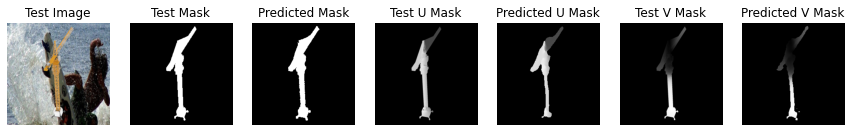

===> Epoch[19/100](0/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3132	Loss_V_Mask: 0.2696
===> Epoch[19/100](1000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3641	Loss_V_Mask: 0.3093
===> Epoch[19/100](2000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3471	Loss_V_Mask: 0.3029
===> Epoch[19/100](3000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3967	Loss_V_Mask: 0.3327
===> Epoch[19/100](4000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.2876	Loss_V_Mask: 0.2450
===> Epoch[19/100](5000/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.3636	Loss_V_Mask: 0.2974
Val_Loss_Mask: 0.0209	Val_U_Loss_Mask: 0.3779	Val_V_Loss_Mask: 0.3542


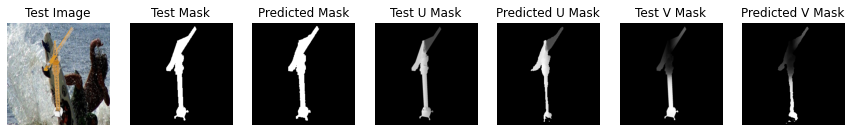

===> Epoch[20/100](0/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3102	Loss_V_Mask: 0.2504
===> Epoch[20/100](1000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3088	Loss_V_Mask: 0.2866
===> Epoch[20/100](2000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3751	Loss_V_Mask: 0.3335
===> Epoch[20/100](3000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.4297	Loss_V_Mask: 0.3862
===> Epoch[20/100](4000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3506	Loss_V_Mask: 0.2772
===> Epoch[20/100](5000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3904	Loss_V_Mask: 0.3440
Val_Loss_Mask: 0.0143	Val_U_Loss_Mask: 0.3558	Val_V_Loss_Mask: 0.3304


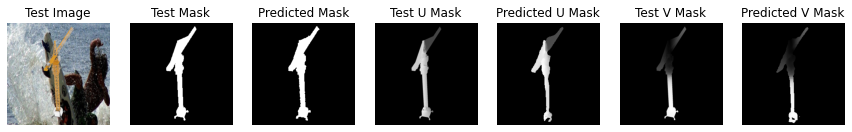

===> Epoch[21/100](0/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.4468	Loss_V_Mask: 0.4110
===> Epoch[21/100](1000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3375	Loss_V_Mask: 0.2984
===> Epoch[21/100](2000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3387	Loss_V_Mask: 0.2982
===> Epoch[21/100](3000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3225	Loss_V_Mask: 0.2518
===> Epoch[21/100](4000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3537	Loss_V_Mask: 0.3023
===> Epoch[21/100](5000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3628	Loss_V_Mask: 0.3045
Val_Loss_Mask: 0.0216	Val_U_Loss_Mask: 0.3635	Val_V_Loss_Mask: 0.3419


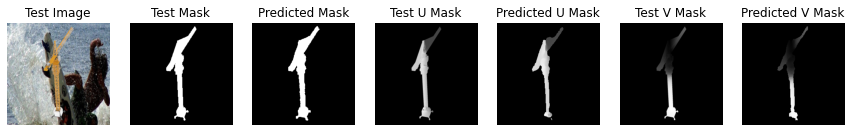

===> Epoch[22/100](0/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.4280	Loss_V_Mask: 0.4159
===> Epoch[22/100](1000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3009	Loss_V_Mask: 0.2586
===> Epoch[22/100](2000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3813	Loss_V_Mask: 0.3386
===> Epoch[22/100](3000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3807	Loss_V_Mask: 0.3445
===> Epoch[22/100](4000/5000): Loss_Mask: 0.0145	Loss_U_Mask: 0.3650	Loss_V_Mask: 0.2971
===> Epoch[22/100](5000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3661	Loss_V_Mask: 0.2972
Val_Loss_Mask: 0.0200	Val_U_Loss_Mask: 0.3804	Val_V_Loss_Mask: 0.3577


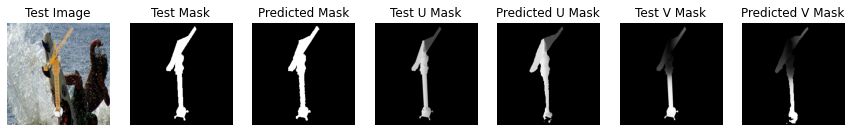

===> Epoch[23/100](0/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3060	Loss_V_Mask: 0.2796
===> Epoch[23/100](1000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.3452	Loss_V_Mask: 0.3214
===> Epoch[23/100](2000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3159	Loss_V_Mask: 0.2792
===> Epoch[23/100](3000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3301	Loss_V_Mask: 0.2816
===> Epoch[23/100](4000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3350	Loss_V_Mask: 0.3028
===> Epoch[23/100](5000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.4082	Loss_V_Mask: 0.3856
Val_Loss_Mask: 0.0190	Val_U_Loss_Mask: 0.3774	Val_V_Loss_Mask: 0.3530


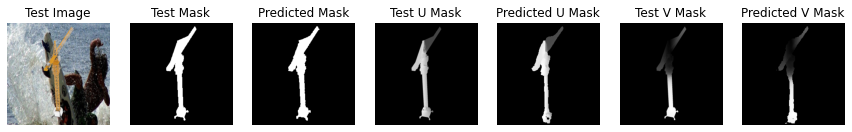

===> Epoch[24/100](0/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3037	Loss_V_Mask: 0.2676
===> Epoch[24/100](1000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3151	Loss_V_Mask: 0.2708
===> Epoch[24/100](2000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.4344	Loss_V_Mask: 0.3854
===> Epoch[24/100](3000/5000): Loss_Mask: 0.0184	Loss_U_Mask: 0.3000	Loss_V_Mask: 0.2497
===> Epoch[24/100](4000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3156	Loss_V_Mask: 0.2623
===> Epoch[24/100](5000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3875	Loss_V_Mask: 0.3392
Val_Loss_Mask: 0.0198	Val_U_Loss_Mask: 0.3698	Val_V_Loss_Mask: 0.3476


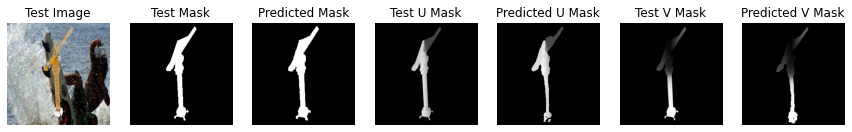

===> Epoch[25/100](0/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3655	Loss_V_Mask: 0.3126
===> Epoch[25/100](1000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.4427	Loss_V_Mask: 0.3685
===> Epoch[25/100](2000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.2797	Loss_V_Mask: 0.2441
===> Epoch[25/100](3000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3097	Loss_V_Mask: 0.2661
===> Epoch[25/100](4000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3067	Loss_V_Mask: 0.2700
===> Epoch[25/100](5000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3786	Loss_V_Mask: 0.3324
Val_Loss_Mask: 0.0192	Val_U_Loss_Mask: 0.3679	Val_V_Loss_Mask: 0.3486


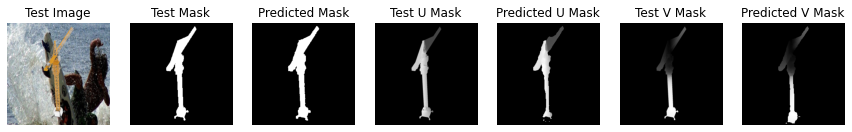

===> Epoch[26/100](0/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3590	Loss_V_Mask: 0.3359
===> Epoch[26/100](1000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3364	Loss_V_Mask: 0.2865
===> Epoch[26/100](2000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3229	Loss_V_Mask: 0.2744
===> Epoch[26/100](3000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3648	Loss_V_Mask: 0.3005
===> Epoch[26/100](4000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3413	Loss_V_Mask: 0.2666
===> Epoch[26/100](5000/5000): Loss_Mask: 0.0071	Loss_U_Mask: 0.2835	Loss_V_Mask: 0.2393
Val_Loss_Mask: 0.0184	Val_U_Loss_Mask: 0.3677	Val_V_Loss_Mask: 0.3481


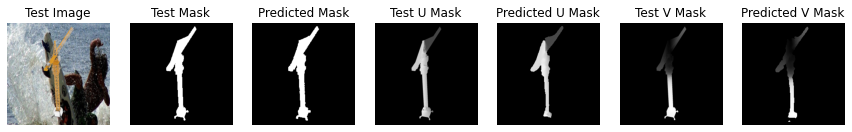

===> Epoch[27/100](0/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3921	Loss_V_Mask: 0.3455
===> Epoch[27/100](1000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.2750	Loss_V_Mask: 0.2452
===> Epoch[27/100](2000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3675	Loss_V_Mask: 0.3180
===> Epoch[27/100](3000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.4170	Loss_V_Mask: 0.3631
===> Epoch[27/100](4000/5000): Loss_Mask: 0.0073	Loss_U_Mask: 0.3093	Loss_V_Mask: 0.2665
===> Epoch[27/100](5000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3248	Loss_V_Mask: 0.2533
Val_Loss_Mask: 0.0179	Val_U_Loss_Mask: 0.3828	Val_V_Loss_Mask: 0.3655


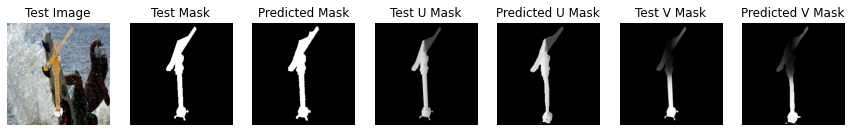

===> Epoch[28/100](0/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3289	Loss_V_Mask: 0.2775
===> Epoch[28/100](1000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3451	Loss_V_Mask: 0.2790
===> Epoch[28/100](2000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3320	Loss_V_Mask: 0.2965
===> Epoch[28/100](3000/5000): Loss_Mask: 0.0150	Loss_U_Mask: 0.4146	Loss_V_Mask: 0.3873
===> Epoch[28/100](4000/5000): Loss_Mask: 0.0174	Loss_U_Mask: 0.3963	Loss_V_Mask: 0.3568
===> Epoch[28/100](5000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.4106	Loss_V_Mask: 0.3474
Val_Loss_Mask: 0.0375	Val_U_Loss_Mask: 0.4152	Val_V_Loss_Mask: 0.3987


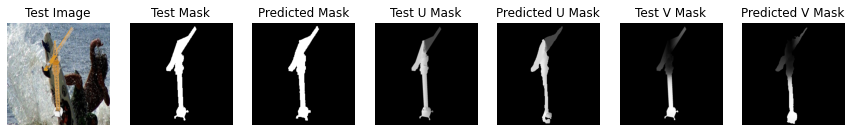

===> Epoch[29/100](0/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3882	Loss_V_Mask: 0.3341
===> Epoch[29/100](1000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3608	Loss_V_Mask: 0.2902
===> Epoch[29/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3573	Loss_V_Mask: 0.3151
===> Epoch[29/100](3000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.2972	Loss_V_Mask: 0.2552
===> Epoch[29/100](4000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3057	Loss_V_Mask: 0.2602
===> Epoch[29/100](5000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3718	Loss_V_Mask: 0.2982
Val_Loss_Mask: 0.0216	Val_U_Loss_Mask: 0.3685	Val_V_Loss_Mask: 0.3519


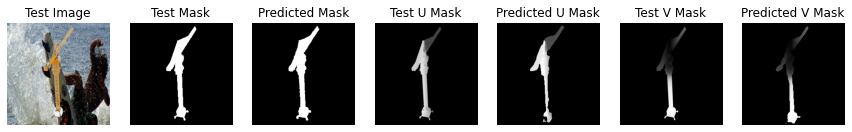

===> Epoch[30/100](0/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3490	Loss_V_Mask: 0.2605
===> Epoch[30/100](1000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3549	Loss_V_Mask: 0.2959
===> Epoch[30/100](2000/5000): Loss_Mask: 0.0076	Loss_U_Mask: 0.3727	Loss_V_Mask: 0.3330
===> Epoch[30/100](3000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3254	Loss_V_Mask: 0.2707
===> Epoch[30/100](4000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3692	Loss_V_Mask: 0.3199
===> Epoch[30/100](5000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3757	Loss_V_Mask: 0.4491
Val_Loss_Mask: 0.0193	Val_U_Loss_Mask: 0.3670	Val_V_Loss_Mask: 0.3481


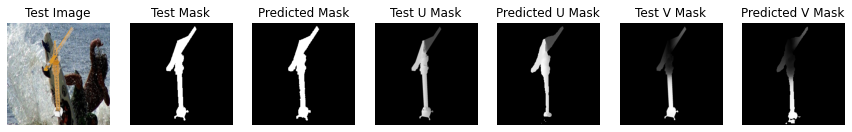

===> Epoch[31/100](0/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3945	Loss_V_Mask: 0.4163
===> Epoch[31/100](1000/5000): Loss_Mask: 0.0212	Loss_U_Mask: 0.5749	Loss_V_Mask: 0.4884
===> Epoch[31/100](2000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3446	Loss_V_Mask: 0.2891
===> Epoch[31/100](3000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3178	Loss_V_Mask: 0.2645
===> Epoch[31/100](4000/5000): Loss_Mask: 0.0065	Loss_U_Mask: 0.4192	Loss_V_Mask: 0.3312
===> Epoch[31/100](5000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3506	Loss_V_Mask: 0.2802
Val_Loss_Mask: 0.0190	Val_U_Loss_Mask: 0.3865	Val_V_Loss_Mask: 0.3786


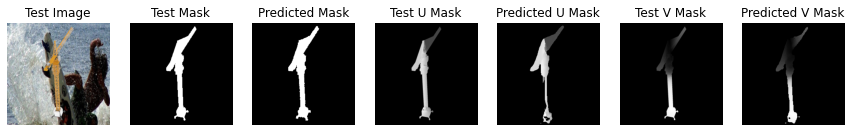

===> Epoch[32/100](0/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3101	Loss_V_Mask: 0.2573
===> Epoch[32/100](1000/5000): Loss_Mask: 0.0072	Loss_U_Mask: 0.3232	Loss_V_Mask: 0.2577
===> Epoch[32/100](2000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.4740	Loss_V_Mask: 0.4335
===> Epoch[32/100](3000/5000): Loss_Mask: 0.0166	Loss_U_Mask: 0.3910	Loss_V_Mask: 0.3535
===> Epoch[32/100](4000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3132	Loss_V_Mask: 0.2493
===> Epoch[32/100](5000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.4128	Loss_V_Mask: 0.3635
Val_Loss_Mask: 0.0189	Val_U_Loss_Mask: 0.3690	Val_V_Loss_Mask: 0.3515


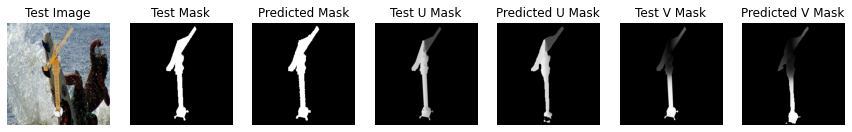

===> Epoch[33/100](0/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.4105	Loss_V_Mask: 0.3919
===> Epoch[33/100](1000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.4527	Loss_V_Mask: 0.4029
===> Epoch[33/100](2000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.2909	Loss_V_Mask: 0.2824
===> Epoch[33/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3206	Loss_V_Mask: 0.2777
===> Epoch[33/100](4000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3854	Loss_V_Mask: 0.3222
===> Epoch[33/100](5000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3392	Loss_V_Mask: 0.2783
Val_Loss_Mask: 0.0204	Val_U_Loss_Mask: 0.3692	Val_V_Loss_Mask: 0.3410


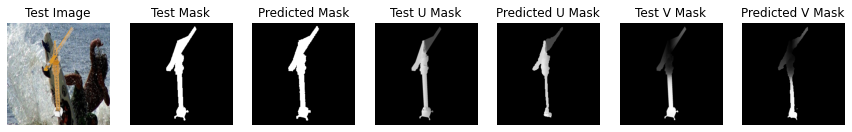

===> Epoch[34/100](0/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3546	Loss_V_Mask: 0.2900
===> Epoch[34/100](1000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3247	Loss_V_Mask: 0.2819
===> Epoch[34/100](2000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3394	Loss_V_Mask: 0.2910
===> Epoch[34/100](3000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3885	Loss_V_Mask: 0.3378
===> Epoch[34/100](4000/5000): Loss_Mask: 0.0075	Loss_U_Mask: 0.3042	Loss_V_Mask: 0.2755
===> Epoch[34/100](5000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3885	Loss_V_Mask: 0.3492
Val_Loss_Mask: 0.0227	Val_U_Loss_Mask: 0.3643	Val_V_Loss_Mask: 0.3451


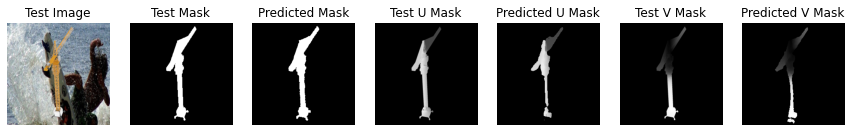

===> Epoch[35/100](0/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3611	Loss_V_Mask: 0.3264
===> Epoch[35/100](1000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3630	Loss_V_Mask: 0.2988
===> Epoch[35/100](2000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.3304	Loss_V_Mask: 0.2819
===> Epoch[35/100](3000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3196	Loss_V_Mask: 0.2729
===> Epoch[35/100](4000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3032	Loss_V_Mask: 0.2458
===> Epoch[35/100](5000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3902	Loss_V_Mask: 0.3326
Val_Loss_Mask: 0.0184	Val_U_Loss_Mask: 0.3716	Val_V_Loss_Mask: 0.3484


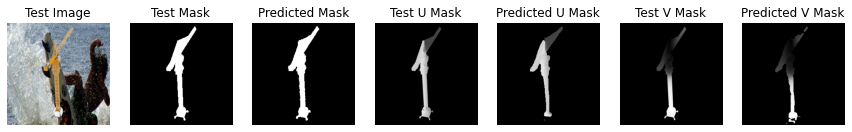

===> Epoch[36/100](0/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3668	Loss_V_Mask: 0.3241
===> Epoch[36/100](1000/5000): Loss_Mask: 0.0072	Loss_U_Mask: 0.2868	Loss_V_Mask: 0.2437
===> Epoch[36/100](2000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3247	Loss_V_Mask: 0.2794
===> Epoch[36/100](3000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3782	Loss_V_Mask: 0.3281
===> Epoch[36/100](4000/5000): Loss_Mask: 0.0077	Loss_U_Mask: 0.2766	Loss_V_Mask: 0.2519
===> Epoch[36/100](5000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3552	Loss_V_Mask: 0.2944
Val_Loss_Mask: 0.0203	Val_U_Loss_Mask: 0.3959	Val_V_Loss_Mask: 0.3811


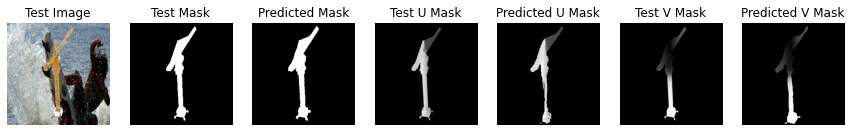

===> Epoch[37/100](0/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3710	Loss_V_Mask: 0.3158
===> Epoch[37/100](1000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3352	Loss_V_Mask: 0.2933
===> Epoch[37/100](2000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3513	Loss_V_Mask: 0.2978
===> Epoch[37/100](3000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3830	Loss_V_Mask: 0.3166
===> Epoch[37/100](4000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3237	Loss_V_Mask: 0.2577
===> Epoch[37/100](5000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3221	Loss_V_Mask: 0.2651
Val_Loss_Mask: 0.0156	Val_U_Loss_Mask: 0.3729	Val_V_Loss_Mask: 0.3535


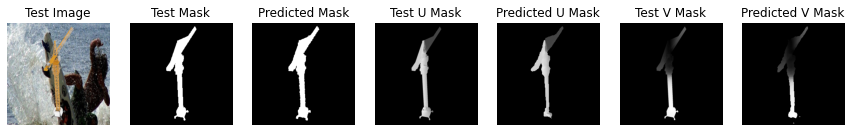

===> Epoch[38/100](0/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3350	Loss_V_Mask: 0.2868
===> Epoch[38/100](1000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3196	Loss_V_Mask: 0.2657
===> Epoch[38/100](2000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3365	Loss_V_Mask: 0.2738
===> Epoch[38/100](3000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3239	Loss_V_Mask: 0.2610
===> Epoch[38/100](4000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3114	Loss_V_Mask: 0.2663
===> Epoch[38/100](5000/5000): Loss_Mask: 0.0298	Loss_U_Mask: 0.3611	Loss_V_Mask: 0.2950
Val_Loss_Mask: 0.0202	Val_U_Loss_Mask: 0.3882	Val_V_Loss_Mask: 0.3707


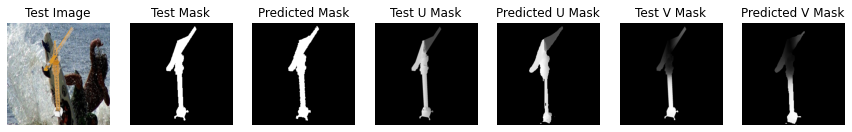

===> Epoch[39/100](0/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3334	Loss_V_Mask: 0.2881
===> Epoch[39/100](1000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3188	Loss_V_Mask: 0.2527
===> Epoch[39/100](2000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.2831	Loss_V_Mask: 0.2572
===> Epoch[39/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3409	Loss_V_Mask: 0.2656
===> Epoch[39/100](4000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3383	Loss_V_Mask: 0.3030
===> Epoch[39/100](5000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3207	Loss_V_Mask: 0.2783
Val_Loss_Mask: 0.0207	Val_U_Loss_Mask: 0.3844	Val_V_Loss_Mask: 0.3655


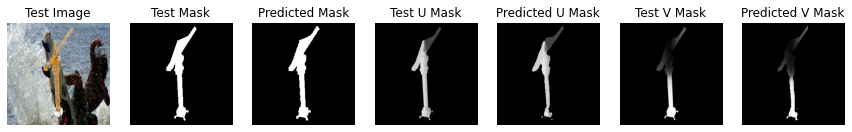

===> Epoch[40/100](0/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.5123	Loss_V_Mask: 0.5189
===> Epoch[40/100](1000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3412	Loss_V_Mask: 0.2859
===> Epoch[40/100](2000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3485	Loss_V_Mask: 0.3111
===> Epoch[40/100](3000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3295	Loss_V_Mask: 0.2931
===> Epoch[40/100](4000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3284	Loss_V_Mask: 0.2964
===> Epoch[40/100](5000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3259	Loss_V_Mask: 0.2711
Val_Loss_Mask: 0.0244	Val_U_Loss_Mask: 0.3613	Val_V_Loss_Mask: 0.3412


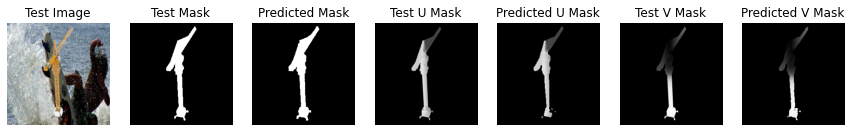

===> Epoch[41/100](0/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3217	Loss_V_Mask: 0.2667
===> Epoch[41/100](1000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.4339	Loss_V_Mask: 0.3750
===> Epoch[41/100](2000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3205	Loss_V_Mask: 0.2645
===> Epoch[41/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3670	Loss_V_Mask: 0.3201
===> Epoch[41/100](4000/5000): Loss_Mask: 0.0073	Loss_U_Mask: 0.3943	Loss_V_Mask: 0.3594
===> Epoch[41/100](5000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3431	Loss_V_Mask: 0.2594
Val_Loss_Mask: 0.0234	Val_U_Loss_Mask: 0.3813	Val_V_Loss_Mask: 0.3612


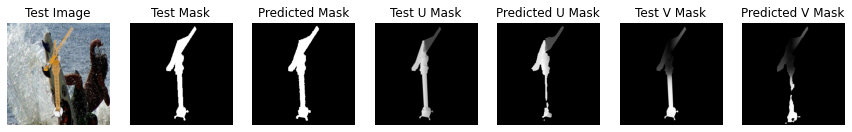

===> Epoch[42/100](0/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3312	Loss_V_Mask: 0.2825
===> Epoch[42/100](1000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3493	Loss_V_Mask: 0.2828
===> Epoch[42/100](2000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3588	Loss_V_Mask: 0.3376
===> Epoch[42/100](3000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3784	Loss_V_Mask: 0.3039
===> Epoch[42/100](4000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.2697	Loss_V_Mask: 0.2302
===> Epoch[42/100](5000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.3091	Loss_V_Mask: 0.2547
Val_Loss_Mask: 0.0185	Val_U_Loss_Mask: 0.3831	Val_V_Loss_Mask: 0.3684


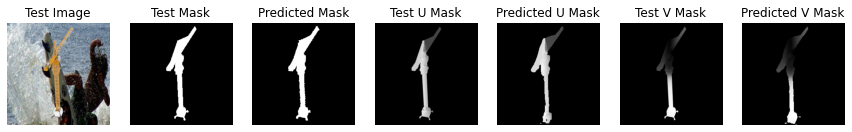

===> Epoch[43/100](0/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3326	Loss_V_Mask: 0.2859
===> Epoch[43/100](1000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3602	Loss_V_Mask: 0.3015
===> Epoch[43/100](2000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3299	Loss_V_Mask: 0.2926
===> Epoch[43/100](3000/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.2962	Loss_V_Mask: 0.2466
===> Epoch[43/100](4000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3616	Loss_V_Mask: 0.3183
===> Epoch[43/100](5000/5000): Loss_Mask: 0.0072	Loss_U_Mask: 0.2912	Loss_V_Mask: 0.2677
Val_Loss_Mask: 0.0255	Val_U_Loss_Mask: 0.3659	Val_V_Loss_Mask: 0.3474


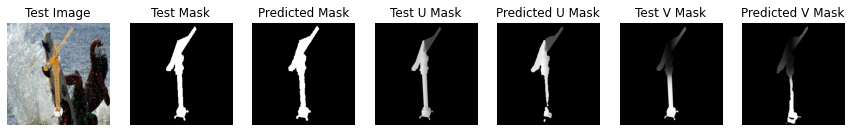

===> Epoch[44/100](0/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3104	Loss_V_Mask: 0.2684
===> Epoch[44/100](1000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3223	Loss_V_Mask: 0.2570
===> Epoch[44/100](2000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3445	Loss_V_Mask: 0.2715
===> Epoch[44/100](3000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3317	Loss_V_Mask: 0.2903
===> Epoch[44/100](4000/5000): Loss_Mask: 0.0151	Loss_U_Mask: 0.3477	Loss_V_Mask: 0.3176
===> Epoch[44/100](5000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3753	Loss_V_Mask: 0.3306
Val_Loss_Mask: 0.0225	Val_U_Loss_Mask: 0.3645	Val_V_Loss_Mask: 0.3362


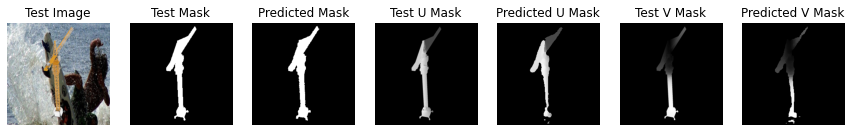

===> Epoch[45/100](0/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3661	Loss_V_Mask: 0.3228
===> Epoch[45/100](1000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3218	Loss_V_Mask: 0.3136
===> Epoch[45/100](2000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3433	Loss_V_Mask: 0.2808
===> Epoch[45/100](3000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3906	Loss_V_Mask: 0.3425
===> Epoch[45/100](4000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3228	Loss_V_Mask: 0.2839
===> Epoch[45/100](5000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3397	Loss_V_Mask: 0.2859
Val_Loss_Mask: 0.0210	Val_U_Loss_Mask: 0.3907	Val_V_Loss_Mask: 0.3756


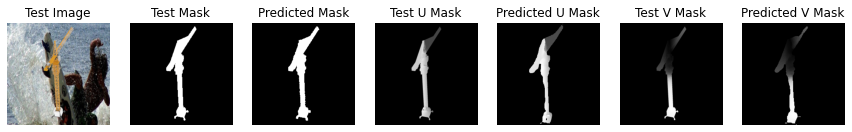

===> Epoch[46/100](0/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3381	Loss_V_Mask: 0.2903
===> Epoch[46/100](1000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3475	Loss_V_Mask: 0.3001
===> Epoch[46/100](2000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3706	Loss_V_Mask: 0.2886
===> Epoch[46/100](3000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3625	Loss_V_Mask: 0.3106
===> Epoch[46/100](4000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3240	Loss_V_Mask: 0.2923
===> Epoch[46/100](5000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3269	Loss_V_Mask: 0.2688
Val_Loss_Mask: 0.0190	Val_U_Loss_Mask: 0.3637	Val_V_Loss_Mask: 0.3405


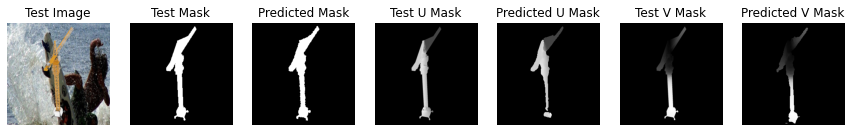

===> Epoch[47/100](0/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3624	Loss_V_Mask: 0.2755
===> Epoch[47/100](1000/5000): Loss_Mask: 0.0064	Loss_U_Mask: 0.3235	Loss_V_Mask: 0.2792
===> Epoch[47/100](2000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3568	Loss_V_Mask: 0.3343
===> Epoch[47/100](3000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3148	Loss_V_Mask: 0.2627
===> Epoch[47/100](4000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3325	Loss_V_Mask: 0.2863
===> Epoch[47/100](5000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3190	Loss_V_Mask: 0.2618
Val_Loss_Mask: 0.0174	Val_U_Loss_Mask: 0.3973	Val_V_Loss_Mask: 0.3765


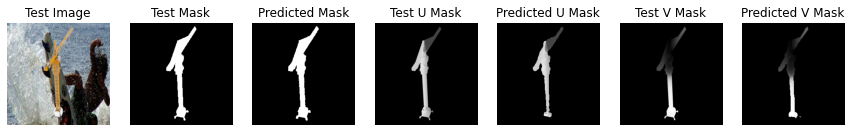

===> Epoch[48/100](0/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3284	Loss_V_Mask: 0.2724
===> Epoch[48/100](1000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3422	Loss_V_Mask: 0.2907
===> Epoch[48/100](2000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3583	Loss_V_Mask: 0.3114
===> Epoch[48/100](3000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3351	Loss_V_Mask: 0.2805
===> Epoch[48/100](4000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3841	Loss_V_Mask: 0.3018
===> Epoch[48/100](5000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3645	Loss_V_Mask: 0.3030
Val_Loss_Mask: 0.0217	Val_U_Loss_Mask: 0.3714	Val_V_Loss_Mask: 0.3485


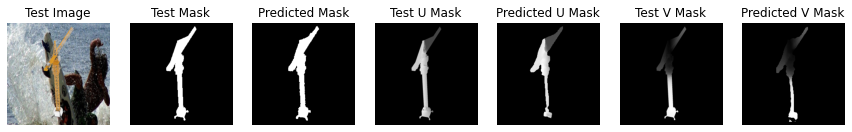

===> Epoch[49/100](0/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3654	Loss_V_Mask: 0.3042
===> Epoch[49/100](1000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3258	Loss_V_Mask: 0.2903
===> Epoch[49/100](2000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3637	Loss_V_Mask: 0.2885
===> Epoch[49/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3425	Loss_V_Mask: 0.2851
===> Epoch[49/100](4000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3397	Loss_V_Mask: 0.2750
===> Epoch[49/100](5000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3223	Loss_V_Mask: 0.2586
Val_Loss_Mask: 0.0242	Val_U_Loss_Mask: 0.3934	Val_V_Loss_Mask: 0.3812


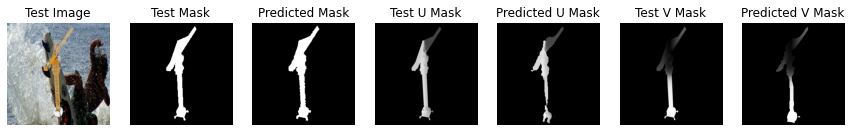

===> Epoch[50/100](0/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.4244	Loss_V_Mask: 0.3614
===> Epoch[50/100](1000/5000): Loss_Mask: 0.0147	Loss_U_Mask: 0.3351	Loss_V_Mask: 0.2830
===> Epoch[50/100](2000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3079	Loss_V_Mask: 0.2634
===> Epoch[50/100](3000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.3318	Loss_V_Mask: 0.2841
===> Epoch[50/100](4000/5000): Loss_Mask: 0.0073	Loss_U_Mask: 0.2654	Loss_V_Mask: 0.2294
===> Epoch[50/100](5000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3520	Loss_V_Mask: 0.2942
Val_Loss_Mask: 0.0159	Val_U_Loss_Mask: 0.3698	Val_V_Loss_Mask: 0.3512


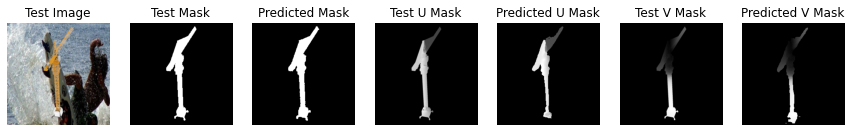

===> Epoch[51/100](0/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3419	Loss_V_Mask: 0.2591
===> Epoch[51/100](1000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3629	Loss_V_Mask: 0.3256
===> Epoch[51/100](2000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3089	Loss_V_Mask: 0.2431
===> Epoch[51/100](3000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.4122	Loss_V_Mask: 0.3479
===> Epoch[51/100](4000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3436	Loss_V_Mask: 0.2930
===> Epoch[51/100](5000/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.3582	Loss_V_Mask: 0.3047
Val_Loss_Mask: 0.0273	Val_U_Loss_Mask: 0.3855	Val_V_Loss_Mask: 0.3602


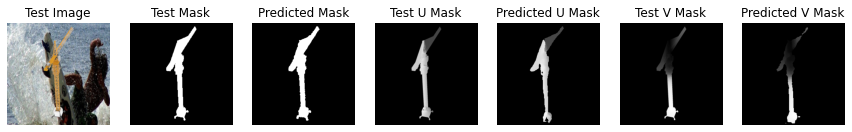

===> Epoch[52/100](0/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3067	Loss_V_Mask: 0.2805
===> Epoch[52/100](1000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3414	Loss_V_Mask: 0.2632
===> Epoch[52/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3362	Loss_V_Mask: 0.2839
===> Epoch[52/100](3000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3143	Loss_V_Mask: 0.2881
===> Epoch[52/100](4000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.4223	Loss_V_Mask: 0.3742
===> Epoch[52/100](5000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3285	Loss_V_Mask: 0.2806
Val_Loss_Mask: 0.0205	Val_U_Loss_Mask: 0.3759	Val_V_Loss_Mask: 0.3592


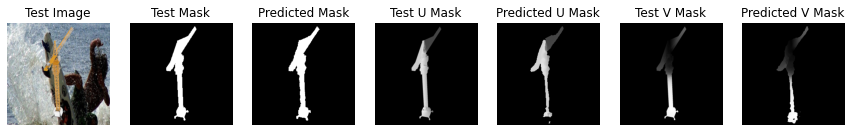

===> Epoch[53/100](0/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3538	Loss_V_Mask: 0.3001
===> Epoch[53/100](1000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3740	Loss_V_Mask: 0.3051
===> Epoch[53/100](2000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3399	Loss_V_Mask: 0.2894
===> Epoch[53/100](3000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3387	Loss_V_Mask: 0.2704
===> Epoch[53/100](4000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3725	Loss_V_Mask: 0.3063
===> Epoch[53/100](5000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3555	Loss_V_Mask: 0.3018
Val_Loss_Mask: 0.0224	Val_U_Loss_Mask: 0.3942	Val_V_Loss_Mask: 0.3802


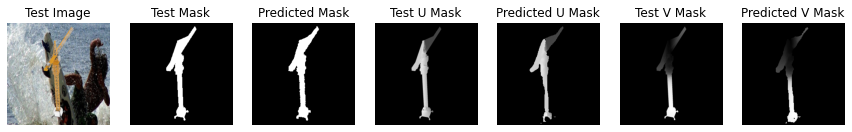

===> Epoch[54/100](0/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3353	Loss_V_Mask: 0.2882
===> Epoch[54/100](1000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3687	Loss_V_Mask: 0.3047
===> Epoch[54/100](2000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.2829	Loss_V_Mask: 0.2300
===> Epoch[54/100](3000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3815	Loss_V_Mask: 0.3215
===> Epoch[54/100](4000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3535	Loss_V_Mask: 0.2769
===> Epoch[54/100](5000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.2772	Loss_V_Mask: 0.2364
Val_Loss_Mask: 0.0173	Val_U_Loss_Mask: 0.3704	Val_V_Loss_Mask: 0.3556


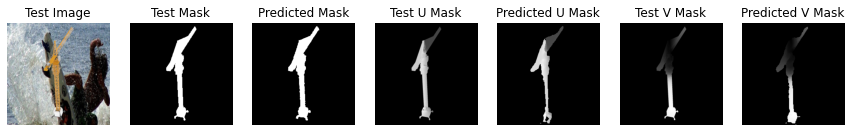

===> Epoch[55/100](0/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3069	Loss_V_Mask: 0.2590
===> Epoch[55/100](1000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3292	Loss_V_Mask: 0.2695
===> Epoch[55/100](2000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.4002	Loss_V_Mask: 0.3314
===> Epoch[55/100](3000/5000): Loss_Mask: 0.0073	Loss_U_Mask: 0.2999	Loss_V_Mask: 0.2473
===> Epoch[55/100](4000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3764	Loss_V_Mask: 0.3248
===> Epoch[55/100](5000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3284	Loss_V_Mask: 0.2890
Val_Loss_Mask: 0.0209	Val_U_Loss_Mask: 0.4304	Val_V_Loss_Mask: 0.3996


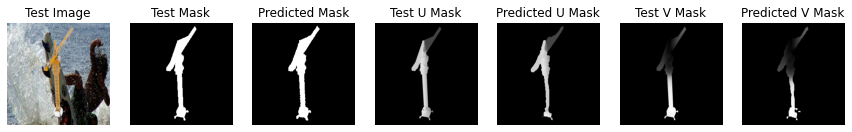

===> Epoch[56/100](0/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3562	Loss_V_Mask: 0.2884
===> Epoch[56/100](1000/5000): Loss_Mask: 0.0070	Loss_U_Mask: 0.2804	Loss_V_Mask: 0.2482
===> Epoch[56/100](2000/5000): Loss_Mask: 0.0075	Loss_U_Mask: 0.3576	Loss_V_Mask: 0.3286
===> Epoch[56/100](3000/5000): Loss_Mask: 0.0140	Loss_U_Mask: 0.3297	Loss_V_Mask: 0.2976
===> Epoch[56/100](4000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3441	Loss_V_Mask: 0.2760
===> Epoch[56/100](5000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.2994	Loss_V_Mask: 0.2513
Val_Loss_Mask: 0.0216	Val_U_Loss_Mask: 0.3892	Val_V_Loss_Mask: 0.3740


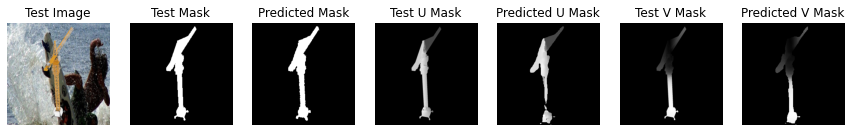

===> Epoch[57/100](0/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3271	Loss_V_Mask: 0.2640
===> Epoch[57/100](1000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.4173	Loss_V_Mask: 0.3478
===> Epoch[57/100](2000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3408	Loss_V_Mask: 0.3034
===> Epoch[57/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3517	Loss_V_Mask: 0.2647
===> Epoch[57/100](4000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3124	Loss_V_Mask: 0.2407
===> Epoch[57/100](5000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3030	Loss_V_Mask: 0.2552
Val_Loss_Mask: 0.0189	Val_U_Loss_Mask: 0.3665	Val_V_Loss_Mask: 0.3466


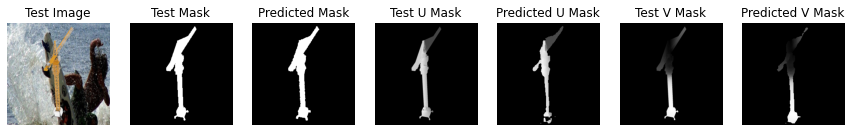

===> Epoch[58/100](0/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3234	Loss_V_Mask: 0.2657
===> Epoch[58/100](1000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3241	Loss_V_Mask: 0.2681
===> Epoch[58/100](2000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3721	Loss_V_Mask: 0.2783
===> Epoch[58/100](3000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3340	Loss_V_Mask: 0.2744
===> Epoch[58/100](4000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3497	Loss_V_Mask: 0.2770
===> Epoch[58/100](5000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3385	Loss_V_Mask: 0.2770
Val_Loss_Mask: 0.0246	Val_U_Loss_Mask: 0.3813	Val_V_Loss_Mask: 0.3625


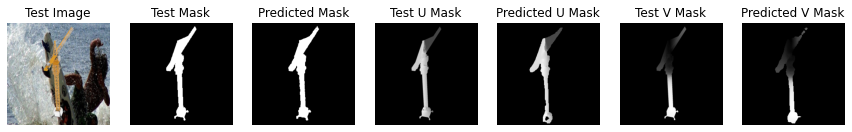

===> Epoch[59/100](0/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3596	Loss_V_Mask: 0.2758
===> Epoch[59/100](1000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3404	Loss_V_Mask: 0.2706
===> Epoch[59/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.2805	Loss_V_Mask: 0.2578
===> Epoch[59/100](3000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3011	Loss_V_Mask: 0.2362
===> Epoch[59/100](4000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3340	Loss_V_Mask: 0.3124
===> Epoch[59/100](5000/5000): Loss_Mask: 0.0077	Loss_U_Mask: 0.3914	Loss_V_Mask: 0.3346
Val_Loss_Mask: 0.0194	Val_U_Loss_Mask: 0.4227	Val_V_Loss_Mask: 0.3999


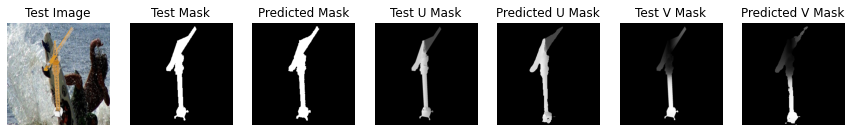

===> Epoch[60/100](0/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3334	Loss_V_Mask: 0.2857
===> Epoch[60/100](1000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3527	Loss_V_Mask: 0.3071
===> Epoch[60/100](2000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3550	Loss_V_Mask: 0.2732
===> Epoch[60/100](3000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3881	Loss_V_Mask: 0.2980
===> Epoch[60/100](4000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.2849	Loss_V_Mask: 0.2370
===> Epoch[60/100](5000/5000): Loss_Mask: 0.0150	Loss_U_Mask: 0.4521	Loss_V_Mask: 0.3753
Val_Loss_Mask: 0.0176	Val_U_Loss_Mask: 0.3692	Val_V_Loss_Mask: 0.3539


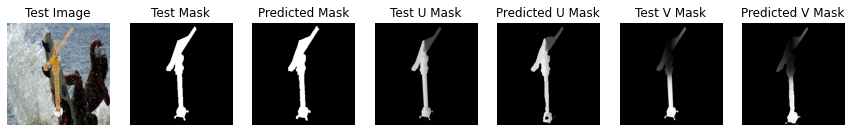

===> Epoch[61/100](0/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3281	Loss_V_Mask: 0.2822
===> Epoch[61/100](1000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3396	Loss_V_Mask: 0.2728
===> Epoch[61/100](2000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3091	Loss_V_Mask: 0.2608
===> Epoch[61/100](3000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.4673	Loss_V_Mask: 0.4285
===> Epoch[61/100](4000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.3128	Loss_V_Mask: 0.2750
===> Epoch[61/100](5000/5000): Loss_Mask: 0.0163	Loss_U_Mask: 0.4058	Loss_V_Mask: 0.3752
Val_Loss_Mask: 0.0279	Val_U_Loss_Mask: 0.3983	Val_V_Loss_Mask: 0.3891


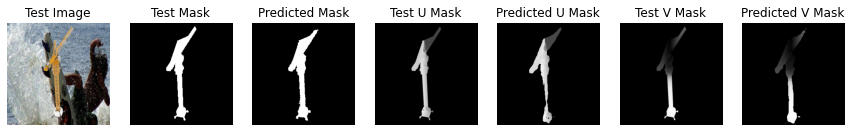

===> Epoch[62/100](0/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3198	Loss_V_Mask: 0.2585
===> Epoch[62/100](1000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3243	Loss_V_Mask: 0.2491
===> Epoch[62/100](2000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3686	Loss_V_Mask: 0.3137
===> Epoch[62/100](3000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.5170	Loss_V_Mask: 0.4737
===> Epoch[62/100](4000/5000): Loss_Mask: 0.0076	Loss_U_Mask: 0.3535	Loss_V_Mask: 0.3028
===> Epoch[62/100](5000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3193	Loss_V_Mask: 0.2498
Val_Loss_Mask: 0.0183	Val_U_Loss_Mask: 0.3918	Val_V_Loss_Mask: 0.3678


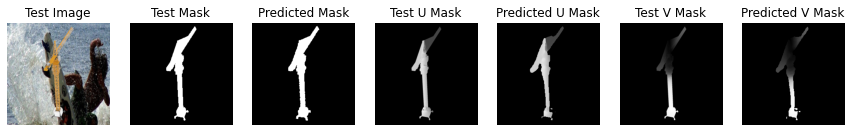

===> Epoch[63/100](0/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3326	Loss_V_Mask: 0.2651
===> Epoch[63/100](1000/5000): Loss_Mask: 0.0073	Loss_U_Mask: 0.3097	Loss_V_Mask: 0.2804
===> Epoch[63/100](2000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.4318	Loss_V_Mask: 0.4058
===> Epoch[63/100](3000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3698	Loss_V_Mask: 0.2993
===> Epoch[63/100](4000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3150	Loss_V_Mask: 0.2754
===> Epoch[63/100](5000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3023	Loss_V_Mask: 0.2762
Val_Loss_Mask: 0.0225	Val_U_Loss_Mask: 0.4022	Val_V_Loss_Mask: 0.3716


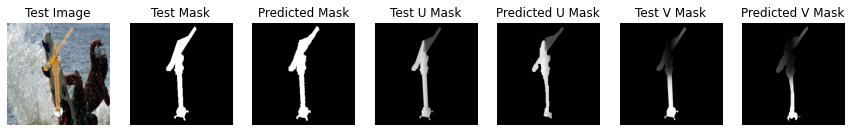

===> Epoch[64/100](0/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3470	Loss_V_Mask: 0.2662
===> Epoch[64/100](1000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3497	Loss_V_Mask: 0.2830
===> Epoch[64/100](2000/5000): Loss_Mask: 0.0161	Loss_U_Mask: 0.3949	Loss_V_Mask: 0.3532
===> Epoch[64/100](3000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3798	Loss_V_Mask: 0.3108
===> Epoch[64/100](4000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3145	Loss_V_Mask: 0.2576
===> Epoch[64/100](5000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.2848	Loss_V_Mask: 0.2441
Val_Loss_Mask: 0.0198	Val_U_Loss_Mask: 0.3710	Val_V_Loss_Mask: 0.3462


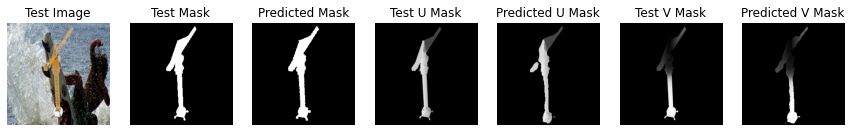

===> Epoch[65/100](0/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3996	Loss_V_Mask: 0.3334
===> Epoch[65/100](1000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.2923	Loss_V_Mask: 0.2382
===> Epoch[65/100](2000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.4272	Loss_V_Mask: 0.3597
===> Epoch[65/100](3000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3090	Loss_V_Mask: 0.2531
===> Epoch[65/100](4000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3504	Loss_V_Mask: 0.3035
===> Epoch[65/100](5000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3450	Loss_V_Mask: 0.2864
Val_Loss_Mask: 0.0213	Val_U_Loss_Mask: 0.3798	Val_V_Loss_Mask: 0.3659


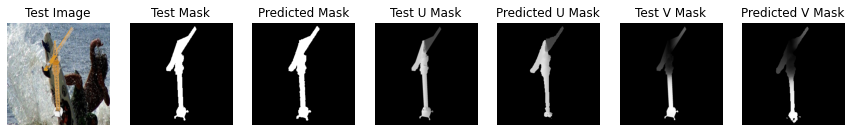

===> Epoch[66/100](0/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3946	Loss_V_Mask: 0.3205
===> Epoch[66/100](1000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3694	Loss_V_Mask: 0.3194
===> Epoch[66/100](2000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3104	Loss_V_Mask: 0.2688
===> Epoch[66/100](3000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3584	Loss_V_Mask: 0.3085
===> Epoch[66/100](4000/5000): Loss_Mask: 0.0075	Loss_U_Mask: 0.3267	Loss_V_Mask: 0.2644
===> Epoch[66/100](5000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3109	Loss_V_Mask: 0.2681
Val_Loss_Mask: 0.0329	Val_U_Loss_Mask: 0.3870	Val_V_Loss_Mask: 0.3733


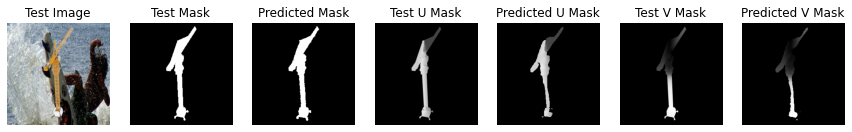

===> Epoch[67/100](0/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.3304	Loss_V_Mask: 0.3062
===> Epoch[67/100](1000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.2807	Loss_V_Mask: 0.2378
===> Epoch[67/100](2000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.4427	Loss_V_Mask: 0.4236
===> Epoch[67/100](3000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.2876	Loss_V_Mask: 0.2698
===> Epoch[67/100](4000/5000): Loss_Mask: 0.0157	Loss_U_Mask: 0.4319	Loss_V_Mask: 0.3882
===> Epoch[67/100](5000/5000): Loss_Mask: 0.0076	Loss_U_Mask: 0.3355	Loss_V_Mask: 0.2982
Val_Loss_Mask: 0.0176	Val_U_Loss_Mask: 0.3762	Val_V_Loss_Mask: 0.3495


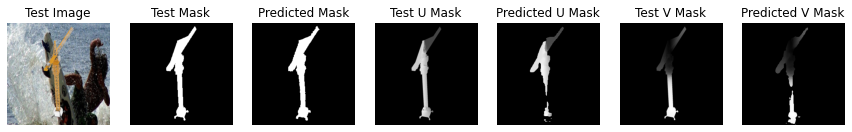

===> Epoch[68/100](0/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.2914	Loss_V_Mask: 0.2428
===> Epoch[68/100](1000/5000): Loss_Mask: 0.0077	Loss_U_Mask: 0.3006	Loss_V_Mask: 0.2617
===> Epoch[68/100](2000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.2893	Loss_V_Mask: 0.2489
===> Epoch[68/100](3000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3337	Loss_V_Mask: 0.2826
===> Epoch[68/100](4000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3512	Loss_V_Mask: 0.2964
===> Epoch[68/100](5000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3531	Loss_V_Mask: 0.2879
Val_Loss_Mask: 0.0453	Val_U_Loss_Mask: 0.3967	Val_V_Loss_Mask: 0.3772


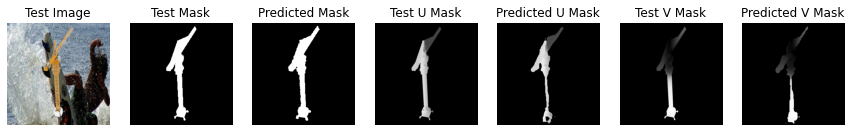

===> Epoch[69/100](0/5000): Loss_Mask: 0.0075	Loss_U_Mask: 0.2687	Loss_V_Mask: 0.2410
===> Epoch[69/100](1000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3499	Loss_V_Mask: 0.2680
===> Epoch[69/100](2000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3501	Loss_V_Mask: 0.3014
===> Epoch[69/100](3000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3615	Loss_V_Mask: 0.2837
===> Epoch[69/100](4000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3613	Loss_V_Mask: 0.2892
===> Epoch[69/100](5000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3496	Loss_V_Mask: 0.2775
Val_Loss_Mask: 0.0226	Val_U_Loss_Mask: 0.3725	Val_V_Loss_Mask: 0.3475


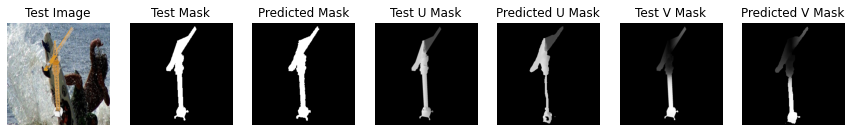

===> Epoch[70/100](0/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3178	Loss_V_Mask: 0.2687
===> Epoch[70/100](1000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.2828	Loss_V_Mask: 0.2537
===> Epoch[70/100](2000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3584	Loss_V_Mask: 0.2731
===> Epoch[70/100](3000/5000): Loss_Mask: 0.0073	Loss_U_Mask: 0.3015	Loss_V_Mask: 0.2327
===> Epoch[70/100](4000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.4321	Loss_V_Mask: 0.3819
===> Epoch[70/100](5000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3182	Loss_V_Mask: 0.2477
Val_Loss_Mask: 0.0185	Val_U_Loss_Mask: 0.3762	Val_V_Loss_Mask: 0.3559


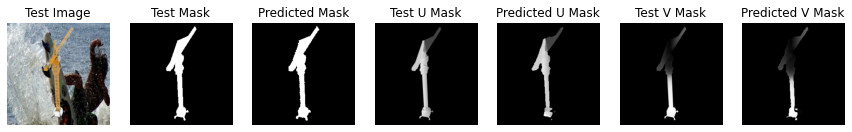

===> Epoch[71/100](0/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3965	Loss_V_Mask: 0.3551
===> Epoch[71/100](1000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3103	Loss_V_Mask: 0.2689
===> Epoch[71/100](2000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.4851	Loss_V_Mask: 0.5061
===> Epoch[71/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3473	Loss_V_Mask: 0.2851
===> Epoch[71/100](4000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.4270	Loss_V_Mask: 0.3672
===> Epoch[71/100](5000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3280	Loss_V_Mask: 0.2795
Val_Loss_Mask: 0.0226	Val_U_Loss_Mask: 0.4034	Val_V_Loss_Mask: 0.3766


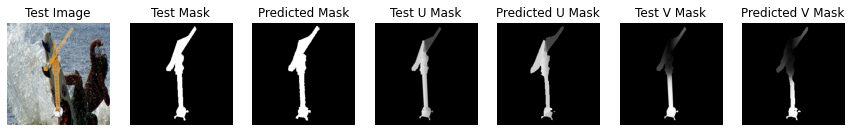

===> Epoch[72/100](0/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3362	Loss_V_Mask: 0.2594
===> Epoch[72/100](1000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.2990	Loss_V_Mask: 0.2617
===> Epoch[72/100](2000/5000): Loss_Mask: 0.0077	Loss_U_Mask: 0.3155	Loss_V_Mask: 0.2742
===> Epoch[72/100](3000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3272	Loss_V_Mask: 0.2696
===> Epoch[72/100](4000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.3363	Loss_V_Mask: 0.3022
===> Epoch[72/100](5000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3872	Loss_V_Mask: 0.3537
Val_Loss_Mask: 0.0235	Val_U_Loss_Mask: 0.3682	Val_V_Loss_Mask: 0.3425


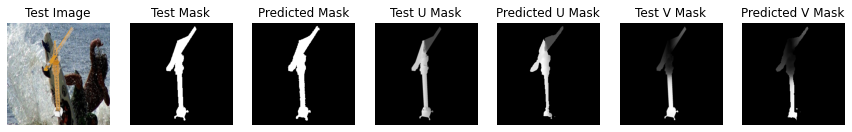

===> Epoch[73/100](0/5000): Loss_Mask: 0.0158	Loss_U_Mask: 0.3413	Loss_V_Mask: 0.2991
===> Epoch[73/100](1000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3492	Loss_V_Mask: 0.2980
===> Epoch[73/100](2000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3365	Loss_V_Mask: 0.2590
===> Epoch[73/100](3000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3451	Loss_V_Mask: 0.2809
===> Epoch[73/100](4000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3784	Loss_V_Mask: 0.3055
===> Epoch[73/100](5000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3836	Loss_V_Mask: 0.3195
Val_Loss_Mask: 0.0219	Val_U_Loss_Mask: 0.4072	Val_V_Loss_Mask: 0.3935


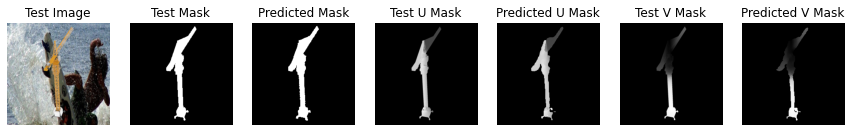

===> Epoch[74/100](0/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3772	Loss_V_Mask: 0.3065
===> Epoch[74/100](1000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3258	Loss_V_Mask: 0.2653
===> Epoch[74/100](2000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3564	Loss_V_Mask: 0.2697
===> Epoch[74/100](3000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3572	Loss_V_Mask: 0.3344
===> Epoch[74/100](4000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3699	Loss_V_Mask: 0.3288
===> Epoch[74/100](5000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3613	Loss_V_Mask: 0.3243
Val_Loss_Mask: 0.0230	Val_U_Loss_Mask: 0.3816	Val_V_Loss_Mask: 0.3662


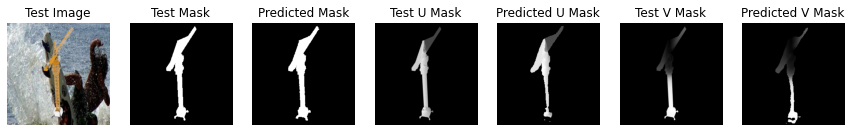

===> Epoch[75/100](0/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3270	Loss_V_Mask: 0.2882
===> Epoch[75/100](1000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3986	Loss_V_Mask: 0.3446
===> Epoch[75/100](2000/5000): Loss_Mask: 0.0073	Loss_U_Mask: 0.2922	Loss_V_Mask: 0.2503
===> Epoch[75/100](3000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.4251	Loss_V_Mask: 0.3779
===> Epoch[75/100](4000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3129	Loss_V_Mask: 0.2720
===> Epoch[75/100](5000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.4860	Loss_V_Mask: 0.4189
Val_Loss_Mask: 0.0173	Val_U_Loss_Mask: 0.3680	Val_V_Loss_Mask: 0.3410


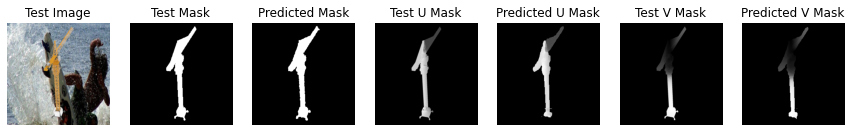

===> Epoch[76/100](0/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3039	Loss_V_Mask: 0.2594
===> Epoch[76/100](1000/5000): Loss_Mask: 0.0071	Loss_U_Mask: 0.3316	Loss_V_Mask: 0.2988
===> Epoch[76/100](2000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3273	Loss_V_Mask: 0.2374
===> Epoch[76/100](3000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3511	Loss_V_Mask: 0.2807
===> Epoch[76/100](4000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3237	Loss_V_Mask: 0.2595
===> Epoch[76/100](5000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.4306	Loss_V_Mask: 0.3636
Val_Loss_Mask: 0.0256	Val_U_Loss_Mask: 0.3817	Val_V_Loss_Mask: 0.3661


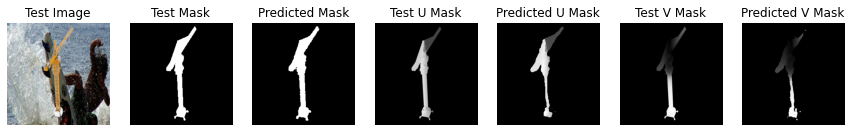

===> Epoch[77/100](0/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3774	Loss_V_Mask: 0.3140
===> Epoch[77/100](1000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3274	Loss_V_Mask: 0.2658
===> Epoch[77/100](2000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3183	Loss_V_Mask: 0.2634
===> Epoch[77/100](3000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3588	Loss_V_Mask: 0.3016
===> Epoch[77/100](4000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3418	Loss_V_Mask: 0.2694
===> Epoch[77/100](5000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3478	Loss_V_Mask: 0.3209
Val_Loss_Mask: 0.0240	Val_U_Loss_Mask: 0.3741	Val_V_Loss_Mask: 0.3436


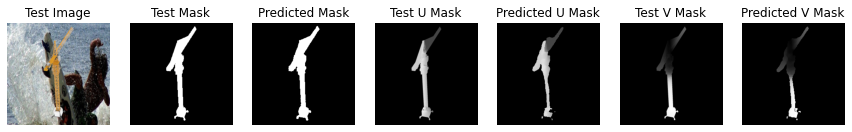

===> Epoch[78/100](0/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.4021	Loss_V_Mask: 0.3507
===> Epoch[78/100](1000/5000): Loss_Mask: 0.0139	Loss_U_Mask: 0.4153	Loss_V_Mask: 0.3436
===> Epoch[78/100](2000/5000): Loss_Mask: 0.0076	Loss_U_Mask: 0.3338	Loss_V_Mask: 0.2827
===> Epoch[78/100](3000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.4101	Loss_V_Mask: 0.3521
===> Epoch[78/100](4000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3717	Loss_V_Mask: 0.3125
===> Epoch[78/100](5000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3660	Loss_V_Mask: 0.3188
Val_Loss_Mask: 0.0203	Val_U_Loss_Mask: 0.3738	Val_V_Loss_Mask: 0.3578


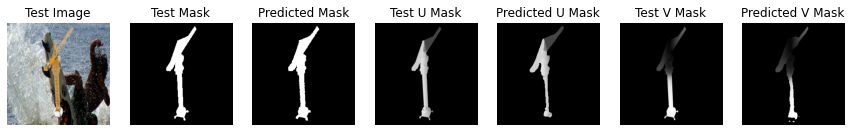

===> Epoch[79/100](0/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3288	Loss_V_Mask: 0.2797
===> Epoch[79/100](1000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3189	Loss_V_Mask: 0.2729
===> Epoch[79/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3076	Loss_V_Mask: 0.2355
===> Epoch[79/100](3000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3254	Loss_V_Mask: 0.2854
===> Epoch[79/100](4000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3415	Loss_V_Mask: 0.2563
===> Epoch[79/100](5000/5000): Loss_Mask: 0.0156	Loss_U_Mask: 0.3042	Loss_V_Mask: 0.2700
Val_Loss_Mask: 0.0198	Val_U_Loss_Mask: 0.3784	Val_V_Loss_Mask: 0.3575


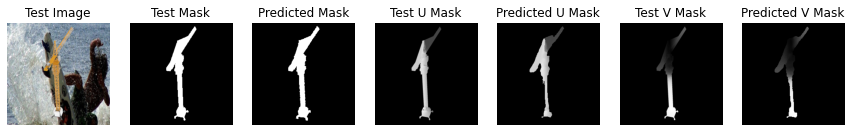

===> Epoch[80/100](0/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3079	Loss_V_Mask: 0.2511
===> Epoch[80/100](1000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3365	Loss_V_Mask: 0.2599
===> Epoch[80/100](2000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3342	Loss_V_Mask: 0.2958
===> Epoch[80/100](3000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3249	Loss_V_Mask: 0.2780
===> Epoch[80/100](4000/5000): Loss_Mask: 0.0077	Loss_U_Mask: 0.3068	Loss_V_Mask: 0.2762
===> Epoch[80/100](5000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3869	Loss_V_Mask: 0.3191
Val_Loss_Mask: 0.0202	Val_U_Loss_Mask: 0.3628	Val_V_Loss_Mask: 0.3389


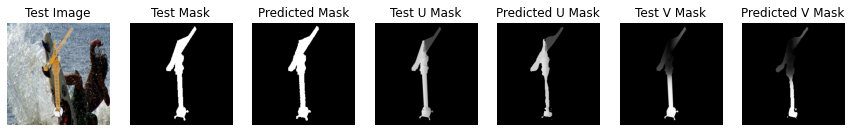

===> Epoch[81/100](0/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.4440	Loss_V_Mask: 0.4137
===> Epoch[81/100](1000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3420	Loss_V_Mask: 0.2862
===> Epoch[81/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3355	Loss_V_Mask: 0.2943
===> Epoch[81/100](3000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3934	Loss_V_Mask: 0.3449
===> Epoch[81/100](4000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3492	Loss_V_Mask: 0.2655
===> Epoch[81/100](5000/5000): Loss_Mask: 0.0077	Loss_U_Mask: 0.3067	Loss_V_Mask: 0.2560
Val_Loss_Mask: 0.0244	Val_U_Loss_Mask: 0.3878	Val_V_Loss_Mask: 0.3758


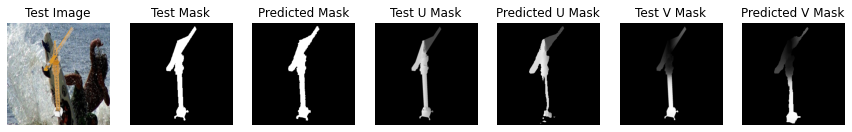

===> Epoch[82/100](0/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3694	Loss_V_Mask: 0.3365
===> Epoch[82/100](1000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3597	Loss_V_Mask: 0.2903
===> Epoch[82/100](2000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.2864	Loss_V_Mask: 0.2366
===> Epoch[82/100](3000/5000): Loss_Mask: 0.0076	Loss_U_Mask: 0.3020	Loss_V_Mask: 0.2576
===> Epoch[82/100](4000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3471	Loss_V_Mask: 0.2636
===> Epoch[82/100](5000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3194	Loss_V_Mask: 0.2384
Val_Loss_Mask: 0.0211	Val_U_Loss_Mask: 0.3947	Val_V_Loss_Mask: 0.3768


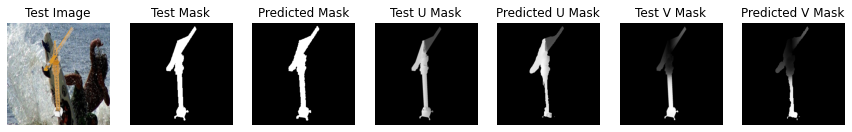

===> Epoch[83/100](0/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3571	Loss_V_Mask: 0.2976
===> Epoch[83/100](1000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3810	Loss_V_Mask: 0.3181
===> Epoch[83/100](2000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3399	Loss_V_Mask: 0.2943
===> Epoch[83/100](3000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3288	Loss_V_Mask: 0.2648
===> Epoch[83/100](4000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3868	Loss_V_Mask: 0.3376
===> Epoch[83/100](5000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3996	Loss_V_Mask: 0.3373
Val_Loss_Mask: 0.0199	Val_U_Loss_Mask: 0.3851	Val_V_Loss_Mask: 0.3804


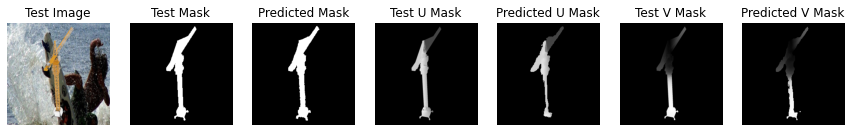

===> Epoch[84/100](0/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.2779	Loss_V_Mask: 0.2375
===> Epoch[84/100](1000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.2852	Loss_V_Mask: 0.2496
===> Epoch[84/100](2000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3331	Loss_V_Mask: 0.2909
===> Epoch[84/100](3000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.2833	Loss_V_Mask: 0.2287
===> Epoch[84/100](4000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3214	Loss_V_Mask: 0.2454
===> Epoch[84/100](5000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3327	Loss_V_Mask: 0.2787
Val_Loss_Mask: 0.0206	Val_U_Loss_Mask: 0.3933	Val_V_Loss_Mask: 0.3806


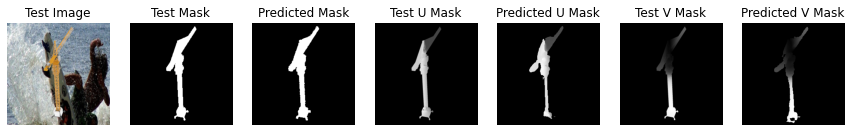

===> Epoch[85/100](0/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3063	Loss_V_Mask: 0.2623
===> Epoch[85/100](1000/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.3727	Loss_V_Mask: 0.3532
===> Epoch[85/100](2000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3431	Loss_V_Mask: 0.2905
===> Epoch[85/100](3000/5000): Loss_Mask: 0.0070	Loss_U_Mask: 0.2991	Loss_V_Mask: 0.2575
===> Epoch[85/100](4000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.5660	Loss_V_Mask: 0.5929
===> Epoch[85/100](5000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3705	Loss_V_Mask: 0.3198
Val_Loss_Mask: 0.0199	Val_U_Loss_Mask: 0.3753	Val_V_Loss_Mask: 0.3602


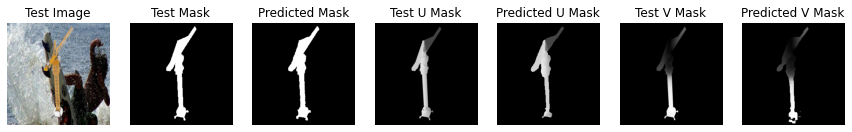

===> Epoch[86/100](0/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.4927	Loss_V_Mask: 0.4648
===> Epoch[86/100](1000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3639	Loss_V_Mask: 0.3056
===> Epoch[86/100](2000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3414	Loss_V_Mask: 0.2874
===> Epoch[86/100](3000/5000): Loss_Mask: 0.0175	Loss_U_Mask: 0.9659	Loss_V_Mask: 0.8909
===> Epoch[86/100](4000/5000): Loss_Mask: 0.0071	Loss_U_Mask: 0.2950	Loss_V_Mask: 0.2519
===> Epoch[86/100](5000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3466	Loss_V_Mask: 0.2956
Val_Loss_Mask: 0.0188	Val_U_Loss_Mask: 0.4289	Val_V_Loss_Mask: 0.4177


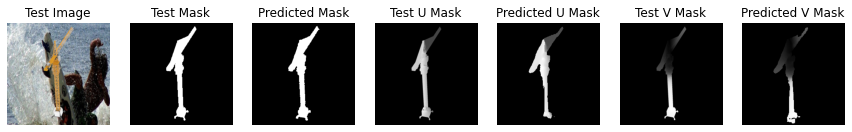

===> Epoch[87/100](0/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3158	Loss_V_Mask: 0.2624
===> Epoch[87/100](1000/5000): Loss_Mask: 0.0072	Loss_U_Mask: 0.2814	Loss_V_Mask: 0.2114
===> Epoch[87/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3270	Loss_V_Mask: 0.2582
===> Epoch[87/100](3000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.4781	Loss_V_Mask: 0.4000
===> Epoch[87/100](4000/5000): Loss_Mask: 0.0070	Loss_U_Mask: 0.3071	Loss_V_Mask: 0.2810
===> Epoch[87/100](5000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3310	Loss_V_Mask: 0.2456
Val_Loss_Mask: 0.0212	Val_U_Loss_Mask: 0.3648	Val_V_Loss_Mask: 0.3513


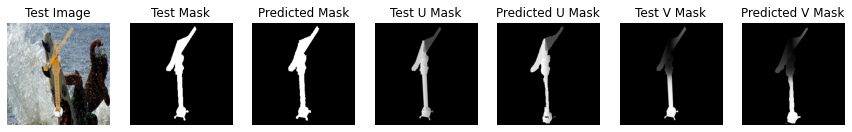

===> Epoch[88/100](0/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.2772	Loss_V_Mask: 0.2316
===> Epoch[88/100](1000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3754	Loss_V_Mask: 0.3432
===> Epoch[88/100](2000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3996	Loss_V_Mask: 0.3609
===> Epoch[88/100](3000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3233	Loss_V_Mask: 0.2731
===> Epoch[88/100](4000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3769	Loss_V_Mask: 0.3162
===> Epoch[88/100](5000/5000): Loss_Mask: 0.0166	Loss_U_Mask: 0.3863	Loss_V_Mask: 0.3245
Val_Loss_Mask: 0.0222	Val_U_Loss_Mask: 0.4119	Val_V_Loss_Mask: 0.4113


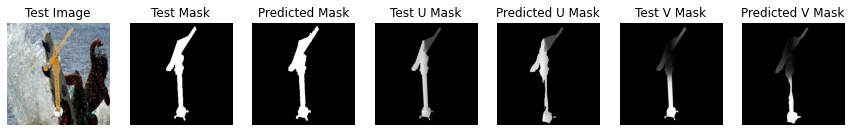

===> Epoch[89/100](0/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3218	Loss_V_Mask: 0.2777
===> Epoch[89/100](1000/5000): Loss_Mask: 0.0075	Loss_U_Mask: 0.3517	Loss_V_Mask: 0.2920
===> Epoch[89/100](2000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3961	Loss_V_Mask: 0.3387
===> Epoch[89/100](3000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3426	Loss_V_Mask: 0.3011
===> Epoch[89/100](4000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3247	Loss_V_Mask: 0.2539
===> Epoch[89/100](5000/5000): Loss_Mask: 0.0075	Loss_U_Mask: 0.2882	Loss_V_Mask: 0.2318
Val_Loss_Mask: 0.0225	Val_U_Loss_Mask: 0.3864	Val_V_Loss_Mask: 0.3864


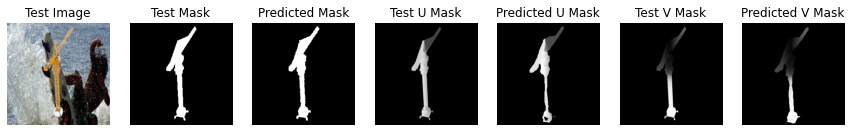

===> Epoch[90/100](0/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3462	Loss_V_Mask: 0.2827
===> Epoch[90/100](1000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3484	Loss_V_Mask: 0.2971
===> Epoch[90/100](2000/5000): Loss_Mask: 0.0158	Loss_U_Mask: 0.4832	Loss_V_Mask: 0.4971
===> Epoch[90/100](3000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3722	Loss_V_Mask: 0.3145
===> Epoch[90/100](4000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.2820	Loss_V_Mask: 0.2467
===> Epoch[90/100](5000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3355	Loss_V_Mask: 0.2973
Val_Loss_Mask: 0.0186	Val_U_Loss_Mask: 0.3740	Val_V_Loss_Mask: 0.3672


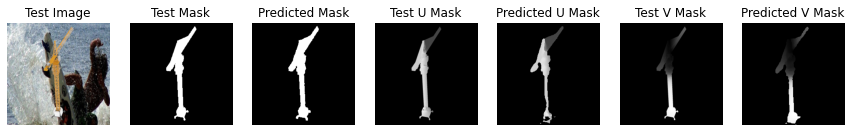

===> Epoch[91/100](0/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3469	Loss_V_Mask: 0.2908
===> Epoch[91/100](1000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3238	Loss_V_Mask: 0.2513
===> Epoch[91/100](2000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3252	Loss_V_Mask: 0.2754
===> Epoch[91/100](3000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3215	Loss_V_Mask: 0.2886
===> Epoch[91/100](4000/5000): Loss_Mask: 0.0077	Loss_U_Mask: 0.2977	Loss_V_Mask: 0.2399
===> Epoch[91/100](5000/5000): Loss_Mask: 0.0213	Loss_U_Mask: 0.3359	Loss_V_Mask: 0.2909
Val_Loss_Mask: 0.0212	Val_U_Loss_Mask: 0.3931	Val_V_Loss_Mask: 0.3726


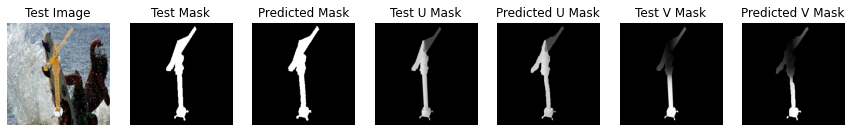

===> Epoch[92/100](0/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.4001	Loss_V_Mask: 0.3262
===> Epoch[92/100](1000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3539	Loss_V_Mask: 0.2833
===> Epoch[92/100](2000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3334	Loss_V_Mask: 0.2794
===> Epoch[92/100](3000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3727	Loss_V_Mask: 0.3453
===> Epoch[92/100](4000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3247	Loss_V_Mask: 0.2829
===> Epoch[92/100](5000/5000): Loss_Mask: 0.0069	Loss_U_Mask: 0.3054	Loss_V_Mask: 0.2536
Val_Loss_Mask: 0.0209	Val_U_Loss_Mask: 0.3814	Val_V_Loss_Mask: 0.3656


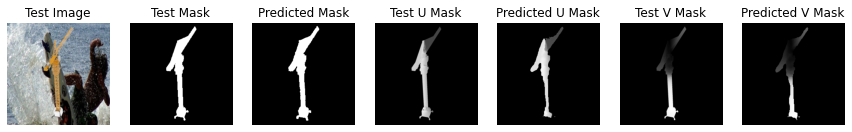

===> Epoch[93/100](0/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.4069	Loss_V_Mask: 0.3773
===> Epoch[93/100](1000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3195	Loss_V_Mask: 0.2611
===> Epoch[93/100](2000/5000): Loss_Mask: 0.0079	Loss_U_Mask: 0.3069	Loss_V_Mask: 0.2753
===> Epoch[93/100](3000/5000): Loss_Mask: 0.0072	Loss_U_Mask: 0.3018	Loss_V_Mask: 0.2407
===> Epoch[93/100](4000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.4269	Loss_V_Mask: 0.3657
===> Epoch[93/100](5000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3792	Loss_V_Mask: 0.2863
Val_Loss_Mask: 0.0321	Val_U_Loss_Mask: 0.3964	Val_V_Loss_Mask: 0.3962


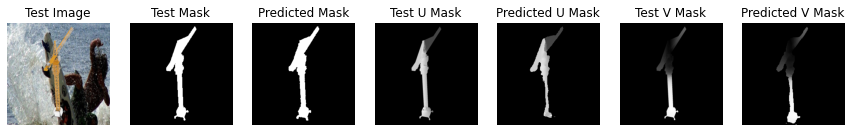

===> Epoch[94/100](0/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3298	Loss_V_Mask: 0.2725
===> Epoch[94/100](1000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3887	Loss_V_Mask: 0.3458
===> Epoch[94/100](2000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.3495	Loss_V_Mask: 0.2775
===> Epoch[94/100](3000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3481	Loss_V_Mask: 0.2631
===> Epoch[94/100](4000/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.3601	Loss_V_Mask: 0.3032
===> Epoch[94/100](5000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.3671	Loss_V_Mask: 0.3462
Val_Loss_Mask: 0.0198	Val_U_Loss_Mask: 0.3733	Val_V_Loss_Mask: 0.3624


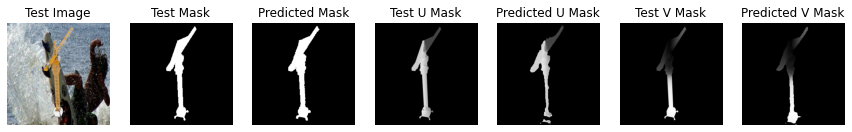

===> Epoch[95/100](0/5000): Loss_Mask: 0.0083	Loss_U_Mask: 0.2779	Loss_V_Mask: 0.2264
===> Epoch[95/100](1000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3549	Loss_V_Mask: 0.2998
===> Epoch[95/100](2000/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3518	Loss_V_Mask: 0.3096
===> Epoch[95/100](3000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3599	Loss_V_Mask: 0.3072
===> Epoch[95/100](4000/5000): Loss_Mask: 0.0080	Loss_U_Mask: 0.3425	Loss_V_Mask: 0.3010
===> Epoch[95/100](5000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3555	Loss_V_Mask: 0.2685
Val_Loss_Mask: 0.0228	Val_U_Loss_Mask: 0.3710	Val_V_Loss_Mask: 0.3610


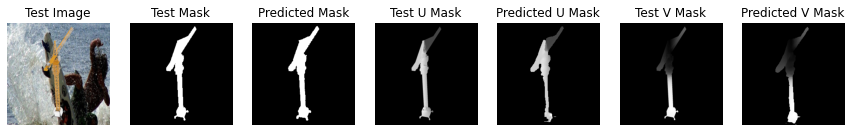

===> Epoch[96/100](0/5000): Loss_Mask: 0.0090	Loss_U_Mask: 0.3694	Loss_V_Mask: 0.3005
===> Epoch[96/100](1000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3131	Loss_V_Mask: 0.2896
===> Epoch[96/100](2000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3867	Loss_V_Mask: 0.3302
===> Epoch[96/100](3000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3408	Loss_V_Mask: 0.2856
===> Epoch[96/100](4000/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.3506	Loss_V_Mask: 0.2959
===> Epoch[96/100](5000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3437	Loss_V_Mask: 0.2814
Val_Loss_Mask: 0.0200	Val_U_Loss_Mask: 0.3964	Val_V_Loss_Mask: 0.3907


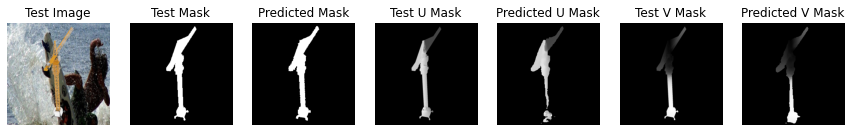

===> Epoch[97/100](0/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3130	Loss_V_Mask: 0.2527
===> Epoch[97/100](1000/5000): Loss_Mask: 0.0071	Loss_U_Mask: 0.2997	Loss_V_Mask: 0.2641
===> Epoch[97/100](2000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3156	Loss_V_Mask: 0.2556
===> Epoch[97/100](3000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.4099	Loss_V_Mask: 0.3518
===> Epoch[97/100](4000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3110	Loss_V_Mask: 0.2649
===> Epoch[97/100](5000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3443	Loss_V_Mask: 0.3000
Val_Loss_Mask: 0.0198	Val_U_Loss_Mask: 0.3666	Val_V_Loss_Mask: 0.3502


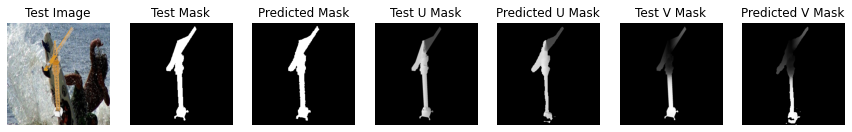

===> Epoch[98/100](0/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3921	Loss_V_Mask: 0.3185
===> Epoch[98/100](1000/5000): Loss_Mask: 0.0078	Loss_U_Mask: 0.3369	Loss_V_Mask: 0.2847
===> Epoch[98/100](2000/5000): Loss_Mask: 0.0088	Loss_U_Mask: 0.3569	Loss_V_Mask: 0.2942
===> Epoch[98/100](3000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3268	Loss_V_Mask: 0.2438
===> Epoch[98/100](4000/5000): Loss_Mask: 0.0172	Loss_U_Mask: 0.3823	Loss_V_Mask: 0.3203
===> Epoch[98/100](5000/5000): Loss_Mask: 0.0074	Loss_U_Mask: 0.3325	Loss_V_Mask: 0.2714
Val_Loss_Mask: 0.0214	Val_U_Loss_Mask: 0.3944	Val_V_Loss_Mask: 0.3700


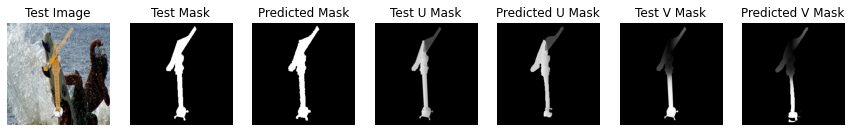

===> Epoch[99/100](0/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3401	Loss_V_Mask: 0.2953
===> Epoch[99/100](1000/5000): Loss_Mask: 0.0087	Loss_U_Mask: 0.3658	Loss_V_Mask: 0.2992
===> Epoch[99/100](2000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3281	Loss_V_Mask: 0.3054
===> Epoch[99/100](3000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3714	Loss_V_Mask: 0.3315
===> Epoch[99/100](4000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3871	Loss_V_Mask: 0.3031
===> Epoch[99/100](5000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.2838	Loss_V_Mask: 0.2531
Val_Loss_Mask: 0.0213	Val_U_Loss_Mask: 0.3819	Val_V_Loss_Mask: 0.3716


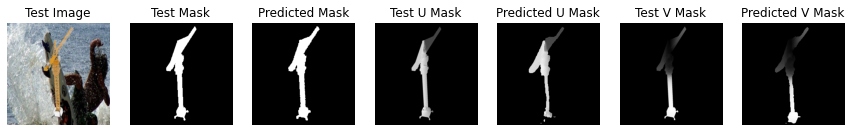

===> Epoch[100/100](0/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3634	Loss_V_Mask: 0.3090
===> Epoch[100/100](1000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.3213	Loss_V_Mask: 0.2717
===> Epoch[100/100](2000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3487	Loss_V_Mask: 0.2929
===> Epoch[100/100](3000/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.2986	Loss_V_Mask: 0.2459
===> Epoch[100/100](4000/5000): Loss_Mask: 0.0089	Loss_U_Mask: 0.3962	Loss_V_Mask: 0.3403
===> Epoch[100/100](5000/5000): Loss_Mask: 0.0085	Loss_U_Mask: 0.3910	Loss_V_Mask: 0.3310
Val_Loss_Mask: 0.0215	Val_U_Loss_Mask: 0.3814	Val_V_Loss_Mask: 0.3703


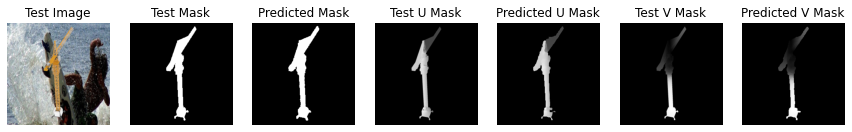

In [15]:
train_avg_mask_losses = []
val_avg_mask_losses = []
train_avg_u_mask_losses = []
val_avg_u_mask_losses = []
train_avg_v_mask_losses = []
val_avg_v_mask_losses = []


for epoch in range(params['epoch_count'], params['epochs'] + 1):
    # train
    correspondence_block.to(device).train()
    cut_num = 5000 # 1epoch = cut_num x batch_size
    
    train_mask_losses = []
    val_mask_losses = []
    train_u_mask_losses = []
    val_u_mask_losses = []
    train_v_mask_losses = []
    val_v_mask_losses = []
    
    for iteration, (batch) in enumerate(train_data_loader):
        
        image, mask, u_mask, v_mask = batch[0].to(device), batch[1].to(device), batch[2].to(device), batch[3].to(device)
        mask_pred, u_mask_pred, v_mask_pred = correspondence_block(image)

        optimizer.zero_grad()
 
        #loss
        loss_m = criterion_m(mask_pred.type(torch.double), mask.type(torch.long))
        loss_u = criterion_u(u_mask_pred.type(torch.double), u_mask)
        loss_v = criterion_v(v_mask_pred.type(torch.double), v_mask)
        loss = loss_m + loss_u + loss_v
        
        loss.backward()
        optimizer.step()
        
        # loss values
        train_mask_losses.append(loss_m.item())
        train_u_mask_losses.append(loss_u.item())
        train_v_mask_losses.append(loss_v.item())

        if iteration % params['log_interval'] == 0:
            print("===> Epoch[{}/{}]({}/{}): Loss_Mask: {:.4f}\tLoss_U_Mask: {:.4f}\tLoss_V_Mask: {:.4f}".format(
                epoch, params['epochs'],iteration, cut_num, loss_m.item(), loss_u.item(), loss_v.item()))
        
        if iteration == cut_num:
            break
        
    # avg loss values for plot
    train_avg_mask_loss = torch.mean(torch.FloatTensor(train_mask_losses)) 
    train_avg_u_mask_loss = torch.mean(torch.FloatTensor(train_u_mask_losses))
    train_avg_v_mask_loss = torch.mean(torch.FloatTensor(train_v_mask_losses))
    train_avg_mask_losses.append(train_avg_mask_loss.item())
    train_avg_u_mask_losses.append(train_avg_u_mask_loss.item())
    train_avg_v_mask_losses.append(train_avg_v_mask_loss.item())

    correspondence_block.to(device).eval()
    
    with torch.no_grad():
        for iteration, (batch) in enumerate(val_data_loader):
            
            image, mask, u_mask, v_mask = batch[0].to(device), batch[1].to(device), batch[2].to(device), batch[3].to(device)
            mask_pred, u_mask_pred, v_mask_pred = correspondence_block(image)

            #loss
            loss_m = criterion_m(mask_pred.type(torch.double), mask.type(torch.long))
            loss_u = criterion_u(u_mask_pred.type(torch.double), u_mask)
            loss_v = criterion_v(v_mask_pred.type(torch.double), v_mask)
            loss = loss_m + loss_u + loss_v

            val_mask_losses.append(loss_m.item())
            val_u_mask_losses.append(loss_u.item())
            val_v_mask_losses.append(loss_v.item())
    
    # avg loss values for plot
    val_avg_mask_loss = torch.mean(torch.FloatTensor(val_mask_losses))
    val_avg_u_mask_loss = torch.mean(torch.FloatTensor(val_u_mask_losses))
    val_avg_v_mask_loss = torch.mean(torch.FloatTensor(val_v_mask_losses))
    val_avg_mask_losses.append(val_avg_mask_loss.item())
    val_avg_u_mask_losses.append(val_avg_u_mask_loss.item())
    val_avg_v_mask_losses.append(val_avg_v_mask_loss.item())
    
    print("Val_Loss_Mask: {:.4f}\tVal_U_Loss_Mask: {:.4f}\tVal_V_Loss_Mask: {:.4f}".format(val_avg_mask_loss.item(),
            val_avg_u_mask_loss.item(), val_avg_v_mask_loss.item()))
    
    # Show result for test image
    image = val_image.to(device)
    mask = val_mask.to(device)
    u_mask = val_u_mask.to(device)
    v_mask = val_v_mask.to(device)
    mask_pred, u_mask_pred, v_mask_pred = correspondence_block(image)
    
    plot_train_result([image, mask, mask_pred, u_mask, u_mask_pred, v_mask, v_mask_pred], epoch, save=False)
    
    # Save weight
    if epoch % 1 == 0:
        torch.save(correspondence_block.state_dict(), checkpoint_path+'/cpb-%s.pt'%epoch)

In [16]:
print('Mask Loss :',np.array(val_avg_mask_losses).argmin()+1, val_avg_mask_losses[np.array(val_avg_mask_losses).argmin()],
      '\tU Mask Loss :',np.array(val_avg_u_mask_losses).argmin()+1, val_avg_u_mask_losses[np.array(val_avg_u_mask_losses).argmin()],
      '\tV Mask Loss :',np.array(val_avg_v_mask_losses).argmin()+1, val_avg_v_mask_losses[np.array(val_avg_v_mask_losses).argmin()])

Mask Loss : 20 0.014289181679487228 	U Mask Loss : 20 0.35583892464637756 	V Mask Loss : 20 0.33042046427726746


# Loss Curve

In [18]:
csvfile=open('./loss/train_u_mask_loss_cpb_unet_DRX.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(train_avg_u_mask_losses).reshape(len(train_avg_u_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

csvfile=open('./loss/val_u_mask_loss_cpb_unet_DRX.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(val_avg_u_mask_losses).reshape(len(val_avg_u_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()
                    
csvfile=open('./loss/train_v_mask_loss_cpb_unet_DRX.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(train_avg_v_mask_losses).reshape(len(train_avg_v_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

csvfile=open('./loss/val_v_mask_loss_cpb_unet_DRX.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(val_avg_v_mask_losses).reshape(len(val_avg_v_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

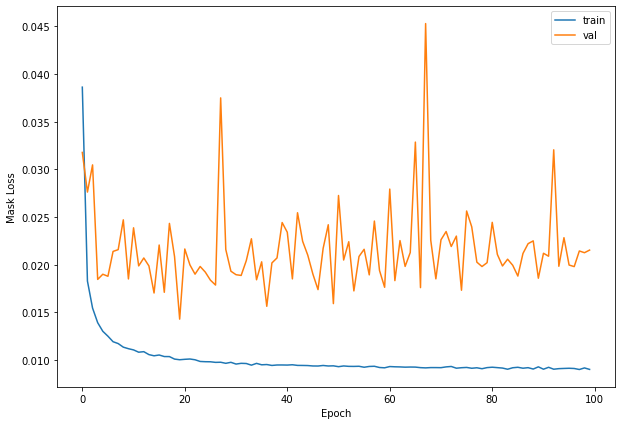

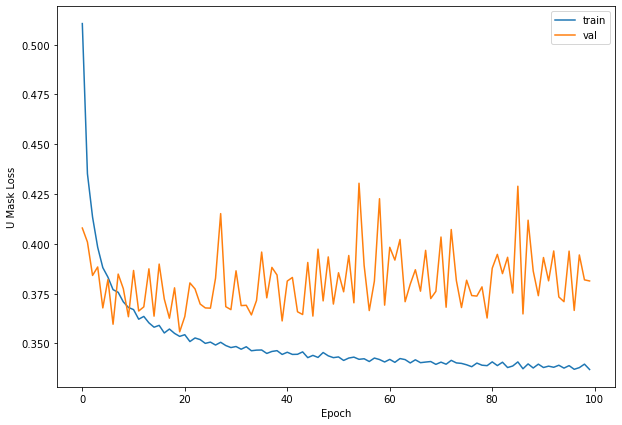

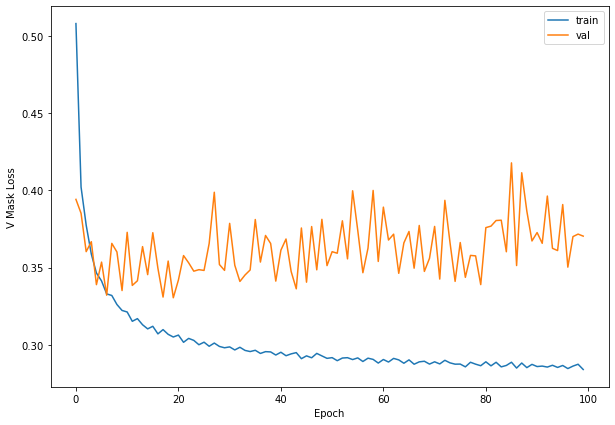

In [17]:
plt.figure(figsize=(10,7))
plt.plot(train_avg_mask_losses, label='train')
plt.plot(val_avg_mask_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('Mask Loss')
plt.legend()

plt.figure(figsize=(10,7))
plt.plot(train_avg_u_mask_losses, label='train')
plt.plot(val_avg_u_mask_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('U Mask Loss')
plt.legend()

plt.figure(figsize=(10,7))
plt.plot(train_avg_v_mask_losses, label='train')
plt.plot(val_avg_v_mask_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('V Mask Loss')
plt.legend()

# Restore Checkpoint

In [19]:
weight_dict = torch.load(checkpoint_path+'/cpb-20.pt')

In [20]:
correspondence_block.load_state_dict(weight_dict)

<All keys matched successfully>

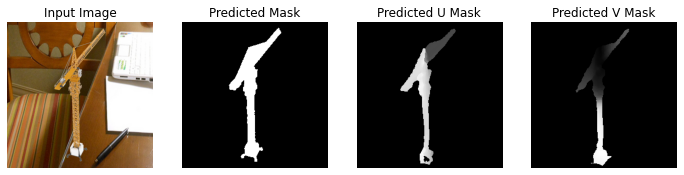

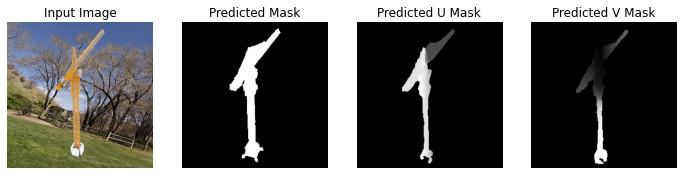

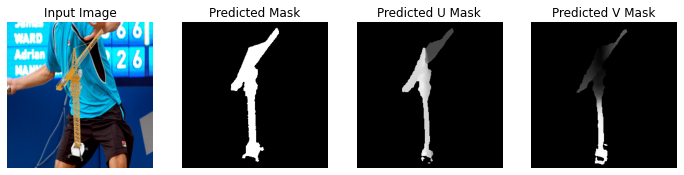

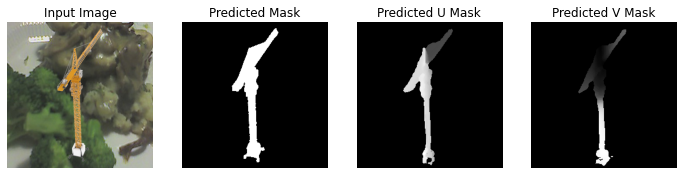

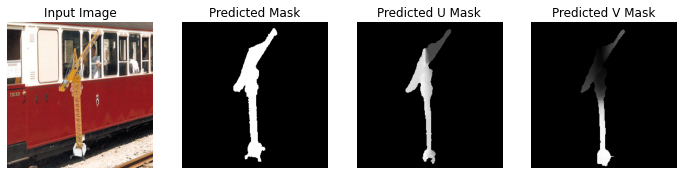

...

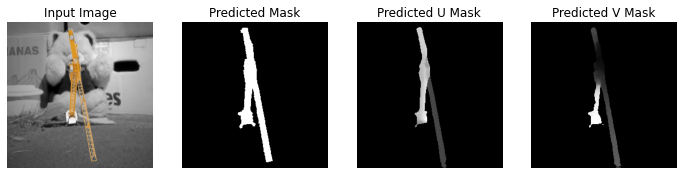

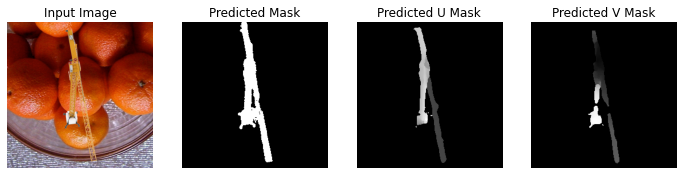

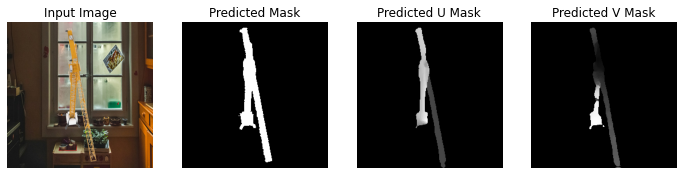

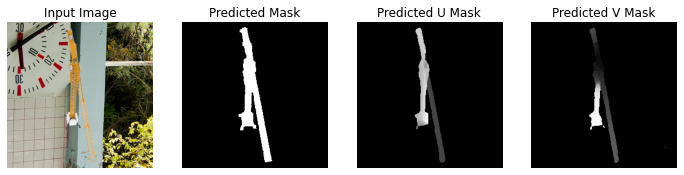

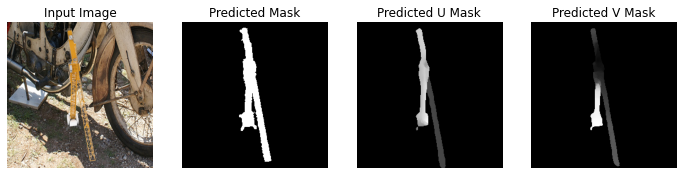

In [21]:
for path in train_image_paths[:50]:
    visualization(correspondence_block, path)

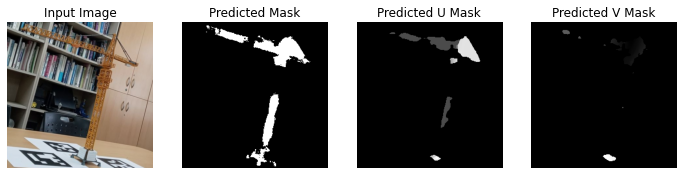

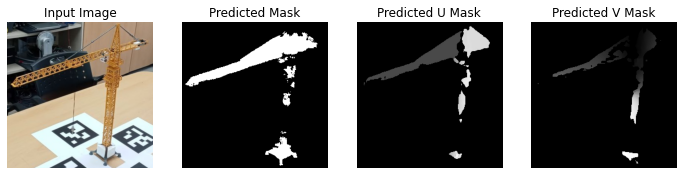

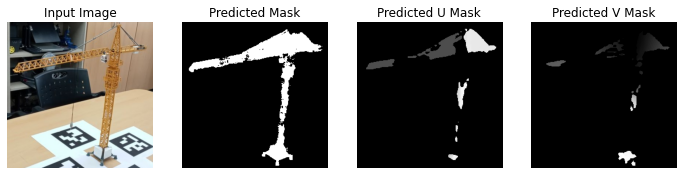

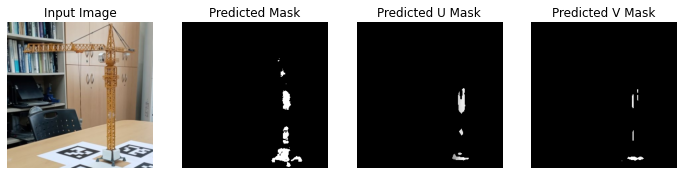

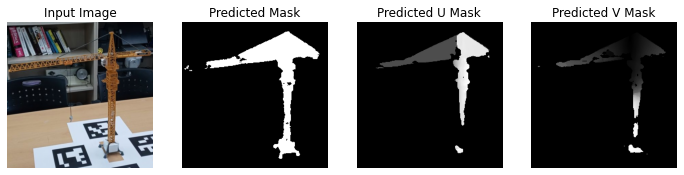

...

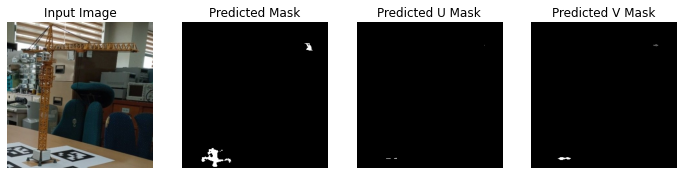

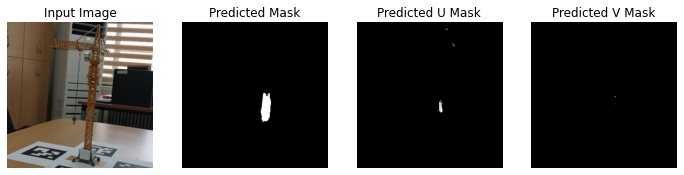

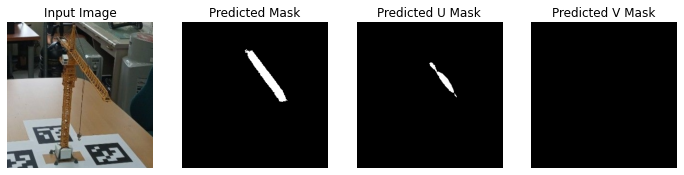

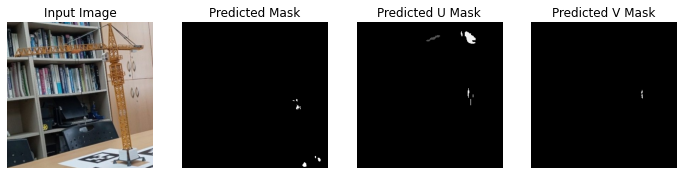

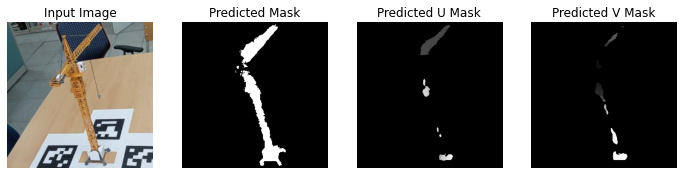

In [22]:
test_path = glob('C:/Users/IVCL/Desktop/crane/real_image_crop/*.png')
for path in test_path:
    visualization(correspondence_block, path)